<h1><b><i>E-Commerce Customer Churn</b></i></h1>
<h3><b>Problem Statement</b>: </h3>
    <p align = 'justify'>E-commerce online EDA adalah perusahaan pada bidang retail yang ingin menghindari adanya pelanggan yang churn karena persaingan di dunia e-commerce yang sangat ketat. Persaingan ketat dapat menyebabkan terjadi penurunan aktivitas pelanggan terhadap produk bisnis (e-commerce EDA) yang berdampak terhadap terjadinya penurunan pendapatan. Persaingan ketat ditandai dengan adanya penurunan frekuensi customer mengunjungi situs e-commerce EDA berdasarkan daysincelastorder. EDA ingin tahu siapa pelanggan yang berpotensi churn melalui churn rate untuk menghindari penurunan pelanggan dan dampak buruk terhadap perusahaan. Kemudian, ketika diketahui potensi churn dari pelanggan, salah satu solusinya dapat dilakukan dengan memberi promo untuk mencegah terjadinya churn.</p>
<h3><b>Goal</b>:</h3>
<p align ='justify'> Menemukan poin-poin yang dapat direkomendasikan untuk meningkatkan engagement
dan menurunkan customer churn rate seperti promo (discount atau jumlah cashback)
yang berhubungan dengan kategori barang yang sering diorder pelanggan beberapa
bulan kebelakang. Pencapaian churn rate yang rendah setelah memberikan tindakan
preventif terhadap perilaku customer yang akan churn melalui ML yang telah di bangun
berdasarkan data historis customer.</p>
<h3><b>Objective</b>: 
</h3>
<li>Mengidentifikasi feature apa yang mempengaruhi customerr untuk churn</li>
<li> Membangun model yang memberikan angka probabilitas kemungkinan churn menggunakan metode <i>supervised learning</i> (klasifikasi)</li>
<li>Memprediksi customer mana yang kedepannya berpotensial mengalami churn</li>
<li>Mengidentifikasi aksi apa yang akan memiliki dampak paling besar untuk me-<i>retain</i> customer</li>
<h3><b>Business Metrics</b>:</h3>
<li>Customer Churn Rate (Main)</li>
<li>Satisfaction Score, Complain Score (Secondary)</li>

<h4><i>Tentang Tim EDA</i></h4>
<p align = 'right'>Sebagai tim data scientist Perusahaan E-Commerce EDA yang bertanggung jawab dalam
meningkatkan performa Perusahaan khususnya dalam kuantitas dan kualitas customer
dengan memberikan rekomendasi untuk mendapatkan loyalitas customer berdasarkan
learning data historis.</p>

<h4><i>Tim Kami</i></h4>
<li>Innocentia Handani</li>
<li>Steven Matlian S</li>
<li>Rizka Septiani</li>
<li>Amalia Kusumaningtyas</li>
<li>Ryan Dwi Prasetyo</li>
<li>Inge Oktaviani</li>

# Import library & package

In [240]:
!gdown --id 1v7BjYPybGlhQ9oNiPwgA-1l1uh3Vi3yW --folder

/usr/local/lib/python3.8/dist-packages/gdown/cli.py:127: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Retrieving folder list
Processing file 14G4xOWK5e-QQ9S7GmBwULChNdeJZXs2U flight.csv
Retrieving folder list completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=14G4xOWK5e-QQ9S7GmBwULChNdeJZXs2U
To: /content/data/flight.csv
100% 8.94M/8.94M [00:00<00:00, 66.9MB/s]
Download completed


In [241]:
#library and package
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

print(pd.__version__)
print(sns.__version__)
print(matplotlib.__version__)

1.3.5
0.11.2
3.5.3


In [242]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [243]:
xls = pd.ExcelFile('/content/drive/MyDrive/Final Project Rakamin/E Commerce Dataset.xlsx')
df = pd.read_excel(xls, 'E Comm')
df.sample(4)

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
5294,55295.0,0.0,9.0,Mobile Phone,1.0,14.0,Debit Card,Male,4.0,5.0,Mobile Phone,1.0,Married,3.0,0.0,19.0,2.0,2.0,2.0,151.90
4324,54325.0,0.0,1.0,Computer,1.0,10.0,Credit Card,Male,4.0,5.0,Mobile Phone,3.0,Married,3.0,1.0,16.0,1.0,2.0,2.0,150.66
2351,52352.0,1.0,12.0,Computer,1.0,34.0,Debit Card,Male,3.0,4.0,Laptop & Accessory,5.0,Single,4.0,0.0,20.0,0.0,1.0,3.0,142.84
1556,51557.0,0.0,3.0,Computer,1.0,6.0,Debit Card,Male,2.0,4.0,Fashion,3.0,Single,2.0,0.0,22.0,4.0,5.0,8.0,184.74


# Exploratory Data Analysis

<b>TIPS & TRICK:</b><br>
<p class ='tab'> <li> fokus pada kecepatan dan kelengkapan eksplorasi bukan estetika visualisasi</li>
<li>jangan menggali business insight karna EDA untuk mempermudah modeling</li>
</p>

<head>
<style>
table, th, td {
  border: ipx solid black;
  border-collapse: collapse;
}
</style>
</head>
<body>
<h1> Variable Description </h1>

<table>
<tr>
  <th>Variable</th>
  <th>Description</th>
</tr>
  <td>CustomerID</td>
  <td>Unique customer ID</td>
</tr>
<tr>
  <td>Churn</td>
  <td>Churn Flag</td>
</tr>
<tr>
  <td>Tenure</td>
  <td>Tenure of customer in organization</td>
</tr>
<tr>
  <td>PreferredLoginDevice</td>
  <td>Preferred login device of customer</td>
</tr>
<tr>
  <td>CityTier</td>
  <td>City tier</td>
</tr><tr>
  <td>WarehouseToHome</td>
  <td>Distance in between warehouse to home of customer</td>
</tr><tr>
  <td>PreferredPaymentMode</td>
  <td>Gender of customer</td>
</tr><tr>
  <td>Gender</td>
  <td>Preferred login device of customer</td>
</tr><tr>
  <td>HourSpendOnApp</td>
  <td>Number of hours spend on mobile application or website</td>
</tr>
<tr>
  <td>NumberOfDeviceRegistered</td>
  <td>Total number of deceives is registered on particular customer</td>
</tr>
<tr>
  <td>PreferedOrderCat</td>
  <td>Preferred order category of customer in last month</td>
</tr>
<tr>
  <td>SatisfactionScore</td>
  <td>Satisfactory score of customer on service</td>
</tr>
<tr>
  <td>MaritalStatus</td>
  <td>Marital status of customer</td>
</tr>
<tr>
  <td>NumberOfAddress</td>
  <td>Total number of added added on particular customer</td>
</tr>
<tr>
  <td>Complain</td>
  <td>Any complaint has been raised in last month</td>
</tr><tr>
  <td>OrderAmountHikeFromlastYear</td>
  <td>Percentage increases in order from last year</td>
</tr>
<tr>
  <td>CouponUsed</td>
  <td>Total number of coupon has been used in last month</td>
</tr>
<tr>
  <td>OrderCount</td>
  <td>Total number of orders has been places in last month</td>
</tr>
<tr>
  <td>DaySinceLastOrder</td>
  <td>Day Since last order by customer</td>
</tr>
<tr>
  <td>CashbackAmount</td>
  <td>Average cashback in last month</td>
</tr>
</table>
</body>

### Data Collecting

In [244]:
#xls = pd.ExcelFile('E Commerce Dataset.xlsx')
#df = pd.read_excel(xls, 'E Comm')
#df.sample(4)

In [245]:
df_num = df.select_dtypes(include = 'number')
df_cat = df.select_dtypes(exclude = 'number')
print(df_num.columns)
print(df_cat.columns)

Index(['CustomerID', 'Churn', 'Tenure', 'CityTier', 'WarehouseToHome',
       'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore',
       'NumberOfAddress', 'Complain', 'OrderAmountHikeFromlastYear',
       'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount'],
      dtype='object')
Index(['PreferredLoginDevice', 'PreferredPaymentMode', 'Gender',
       'PreferedOrderCat', 'MaritalStatus'],
      dtype='object')


<i>
<ul>Numerical data
<li>apakah nilai yang tertera pada setiap kolom masuk akal? -dari output describe-</li>
<li>apakah nilai maksimal/minimal masih berada dibatas wajar?</li>
<li>apakah ada kolom dengan perbedaan yang signifikan antara mean dan median?</li>
</ul>
<hr>
<ul>Categorical data
<li>apakah jumlah unique values masuk akal?</li>
<li>apakah frekuensi dari nilai yang paling umum terlalu timpang?</li>
</ul>

### Descriptive Statistic

In [246]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   float64
 1   Churn                        5630 non-null   float64
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   float64
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   float64
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   float64
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

In [247]:
df_num.describe().T

,count,mean,std,min,25%,50%,75%,max
CustomerID,5630.0,52815.500000,1625.385339,50001.0,51408.25,52815.50,54222.7500,55630.00
Churn,5630.0,0.168384,0.374240,0.0,0.00,0.00,0.0000,1.00
Tenure,5366.0,10.189899,8.557241,0.0,2.00,9.00,16.0000,61.00
CityTier,5630.0,1.654707,0.915389,1.0,1.00,1.00,3.0000,3.00
WarehouseToHome,5379.0,15.639896,8.531475,5.0,9.00,14.00,20.0000,127.00
HourSpendOnApp,5375.0,2.931535,0.721926,0.0,2.00,3.00,3.0000,5.00
NumberOfDeviceRegistered,5630.0,3.688988,1.023999,1.0,3.00,4.00,4.0000,6.00
SatisfactionScore,5630.0,3.066785,1.380194,1.0,2.00,3.00,4.0000,5.00
NumberOfAddress,5630.0,4.214032,2.583586,1.0,2.00,3.00,6.0000,22.00
Complain,5630.0,0.284902,0.451408,0.0,0.00,0.00,1.0000,1.00


<b>apakah nilai yang tertera pada setiap kolom masuk akal?</b><br>
<li>jumlah count berbeda-beda, artinya ada data NaN.</li>

In [248]:
df.describe().loc[['min','max']].T

,min,max
CustomerID,50001.0,55630.00
Churn,0.0,1.00
Tenure,0.0,61.00
CityTier,1.0,3.00
WarehouseToHome,5.0,127.00
HourSpendOnApp,0.0,5.00
NumberOfDeviceRegistered,1.0,6.00
SatisfactionScore,1.0,5.00
NumberOfAddress,1.0,22.00
Complain,0.0,1.00


<b>apakah nilai maksimal/minimal masih berada dibatas wajar?</b><br>
<li>Churn, CityTier merupakan data kategorikal</li>
<li>Apa informasi yang didapatkan dari angka tenure? Apakah lama customer menggunakan layanan?</li>
<li>WarehouseToHome, angka maksimalnya 127km, apakah ini karena mmg tidak ada warehouse yang lebih dekat atau lainnya?</li>
<li>NumberOfAddress perlu diperhatikan lebih lanjutkan jika ingin digunakan</li>

In [249]:
df.describe().loc[['mean','50%']].T

,mean,50%
CustomerID,52815.500000,52815.50
Churn,0.168384,0.00
Tenure,10.189899,9.00
CityTier,1.654707,1.00
WarehouseToHome,15.639896,14.00
HourSpendOnApp,2.931535,3.00
NumberOfDeviceRegistered,3.688988,4.00
SatisfactionScore,3.066785,3.00
NumberOfAddress,4.214032,3.00
Complain,0.284902,0.00


<b>apakah ada kolom dengan perbedaan yang signifikan antara mean dan median?</b><br>
<li>NumberOfAddress kemungkinan ada outlier karena nilai maksimal adalah 22 tetapi median dan meannya berada diangka 4.2 dan 3</li>

In [250]:
df_cat.describe().T

,count,unique,top,freq
PreferredLoginDevice,5630,3,Mobile Phone,2765
PreferredPaymentMode,5630,7,Debit Card,2314
Gender,5630,2,Male,3384
PreferedOrderCat,5630,6,Laptop & Accessory,2050
MaritalStatus,5630,3,Married,2986


<b>apakah jumlah unique values masuk akal?</b>
<li>tidak ada yang janggal</li>
<b>apakah frekuensi dari nilai yang paling umum terlalu timpang?</b>
<li>Gender:Male, terlihat lebih dari setengah dari data</li>
<li>MartialStatus:Married, memiliki jumlah data lebih dari setengah dari 3 pilihan</li>

In [251]:
df_cat['PreferredLoginDevice'].value_counts()

Mobile Phone    2765
Computer        1634
Phone           1231
Name: PreferredLoginDevice, dtype: int64

Apakah mobile phone dan phone sama? jika sama berarti harus di rename salah satunya <br>
apakah kalau misal di rename itu sebelum di split data atau setelah?

In [252]:
df_cat['PreferredPaymentMode'].unique()

array(['Debit Card', 'UPI', 'CC', 'Cash on Delivery', 'E wallet', 'COD',
       'Credit Card'], dtype=object)

In [253]:
df_cat['PreferedOrderCat'].unique()

array(['Laptop & Accessory', 'Mobile', 'Mobile Phone', 'Others',
       'Fashion', 'Grocery'], dtype=object)

In [254]:
df_cat['MaritalStatus'].unique()

array(['Single', 'Divorced', 'Married'], dtype=object)

In [255]:
df.isna().sum()

CustomerID                       0
Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

<i>
<ul>
<li>Apakah ada data dengan tipe data yang kurang sesuai?</li></i>
ya, pada CityTier dan Churn daripada numerik ada baiknya menjadi kategorikal
<i>
<li>Apakah ada data yang hilang?</li></i>
ya, terdapat 7 feature yang datanya tidak lengkap atau kosong
</ul>

### Univariate Analysis

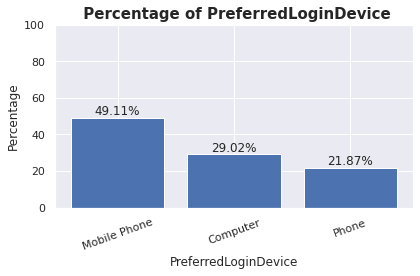

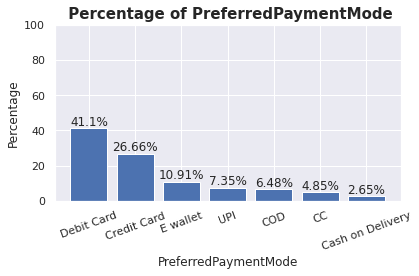

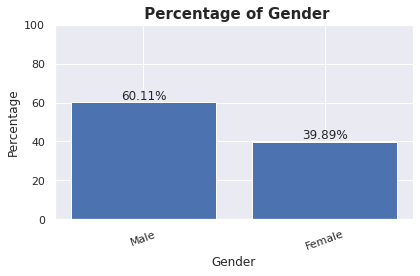

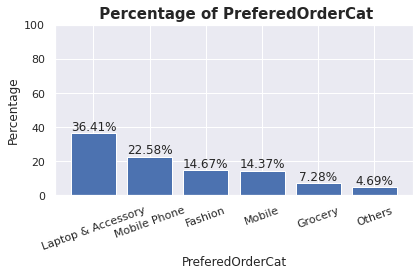

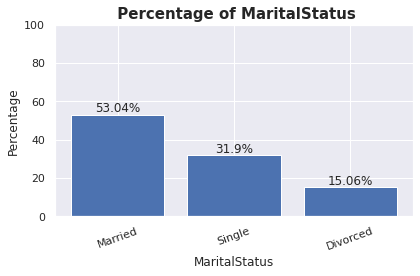

In [256]:
cat_var=df.select_dtypes(exclude = 'number')

# Calculate the percentage of each categorical variable
for column in cat_var:
    counts = df[column].value_counts()
    percent = round((counts / len(df)) * 100,2)
    
# Create the bar plot
    fig, ax = plt.subplots()
    ax.bar(counts.index, percent)
    ax.set_xlabel(column)
    ax.set_ylabel('Percentage')
    ax.set_ylim(0, 100)
    ax.set_title(f" Percentage of {column}", fontweight='bold', fontsize=15)

# Add the percentage labels to the bars
    for i in range(len(percent)):
        value = round(percent[i], 2)
        label = f'{value}%'
        plt.text(i, percent[i], label, ha='center', va='bottom')
        plt.xticks(rotation=20)
    
# Show the plot
    plt.tight_layout()
    plt.show()

In [257]:
df_joinduplicate=df.copy()
#menggabungkan phone ke mobile phone pada kolom PreferredLoginDevice
#menggabungkan COD ke cash on delivery pada kolom PreferredPaymentMode
#menggabungkan CC ke credit card pada kolom PreferredPaymentMode
#menggabungkan mobile ke Mobilephone card pada kolom PreferedOrderCat
df_joinduplicate['PreferredLoginDevice'] = df_joinduplicate['PreferredLoginDevice'].replace("Phone", "Mobile Phone")
df_joinduplicate['PreferredPaymentMode'] = df_joinduplicate['PreferredPaymentMode'].replace("COD", "Cash on Delivery")
df_joinduplicate['PreferredPaymentMode'] = df_joinduplicate['PreferredPaymentMode'].replace("CC", "Credit Card")
df_joinduplicate['PreferedOrderCat'] = df_joinduplicate['PreferedOrderCat'].replace("Mobile", "Mobile Phone")
df_joinduplicate.sample(4)


,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
2459,52460.0,0.0,21.0,Mobile Phone,1.0,NaN,UPI,Female,3.0,3.0,Mobile Phone,5.0,Married,9.0,0.0,12.0,6.0,7.0,6.0,123.67
2723,52724.0,0.0,15.0,Mobile Phone,3.0,18.0,E wallet,Male,3.0,3.0,Laptop & Accessory,1.0,Married,4.0,1.0,12.0,1.0,1.0,0.0,150.87
883,50884.0,0.0,27.0,Mobile Phone,1.0,6.0,Credit Card,Female,2.0,3.0,Grocery,2.0,Single,7.0,0.0,19.0,NaN,12.0,7.0,273.28
5118,55119.0,0.0,8.0,Mobile Phone,1.0,16.0,Debit Card,Male,3.0,4.0,Fashion,1.0,Married,2.0,0.0,12.0,1.0,2.0,NaN,210.00


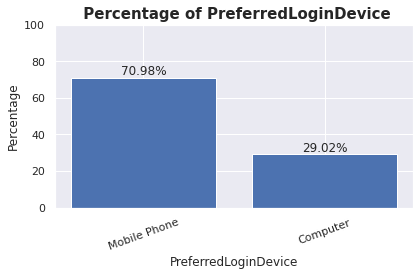

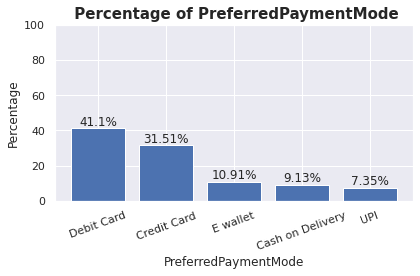

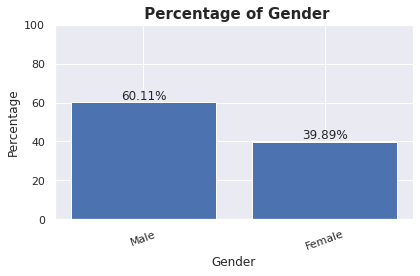

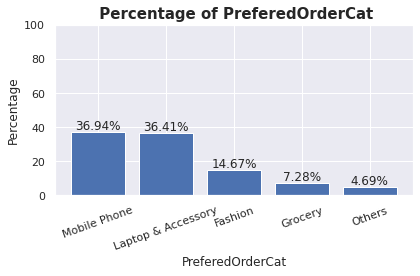

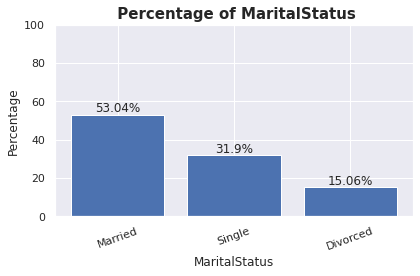

In [258]:
cat_var=df_joinduplicate.select_dtypes(exclude = 'number')

# Calculate the percentage of each categorical variable
for column in cat_var:
    counts = df_joinduplicate[column].value_counts()
    percent = round((counts / len(df_joinduplicate)) * 100,2)
    
# Create the bar plot
    fig, ax = plt.subplots()
    ax.bar(counts.index, percent)
    ax.set_xlabel(column)
    ax.set_ylabel('Percentage')
    ax.set_ylim(0, 100)
    ax.set_title(f" Percentage of {column}", fontweight='bold', fontsize=15)

# Add the percentage labels to the bars
    for i in range(len(percent)):
        value = round(percent[i], 2)
        label = f'{value}%'
        plt.text(i, percent[i], label, ha='center', va='bottom')
        plt.xticks(rotation=20)
    
# Show the plot
    plt.tight_layout()
    plt.show()

*Interpretasi* :
Plot diatas persentase dari banyak data disetiap variable di masing masing features categorical

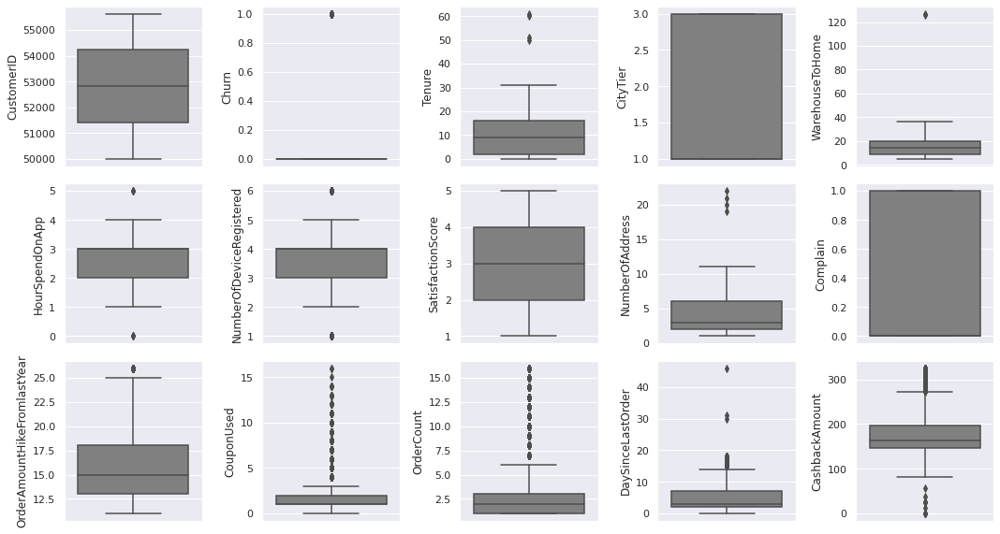

In [259]:
features = df_num.columns
fig = plt.subplots(figsize=(15,8))
for i in range(0, len(features)):
    plt.subplot(3, int(len(features)/3), i+1)
    sns.boxplot(y=df[features[i]],color='grey', orient='v')
plt.tight_layout()
plt.show()

<li>Citytier -> categorical</li>
<li>Complain -> categorical</li>
<li>Churn -> categorical</li><br>
Berapa banyak dan berapa jauh outlier di setiap kolom?
<li> HourSpendingOnApp dan NumberOfDeliveryRegistered memiliki outlier pada nilai min dan max</li>
<li> Pada WarehouseToHome ada pencilan dengan jarak yang jauh</li>
<li> CashbackAmount memiliki banyak pencilan</li>
<li>CouponUsed dan OrderCount juga memiliki banyak pencilan</li>

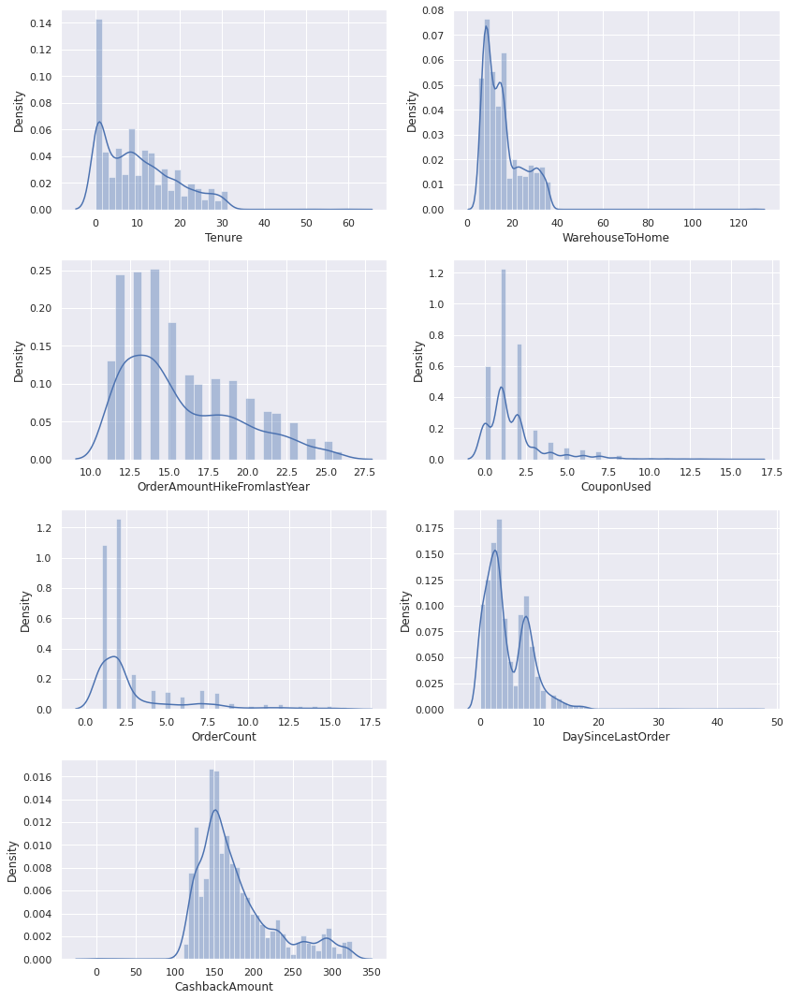

In [260]:
#individual displot for tenure, warehousetohome, OrderAmountHikeFromlastYear, couponused, ordercount,
#daysincelastorder, cashbackamount
col = ['Tenure','WarehouseToHome','OrderAmountHikeFromlastYear','CouponUsed','OrderCount',
       'DaySinceLastOrder','CashbackAmount']
fig = plt.subplots(figsize=(12,15))
for i in range(0, len(col)):
    plt.subplot(4, int(len(col)/3), i+1)
    sns.distplot(df[col[i]])
plt.tight_layout()
plt.show()

<ul>Individual Displot
<li>bagaimana bentuk distribusi setiap kolom?</li>
<li>apakah ada nilai-nilai tertentu yang umum?</li>
</ul>

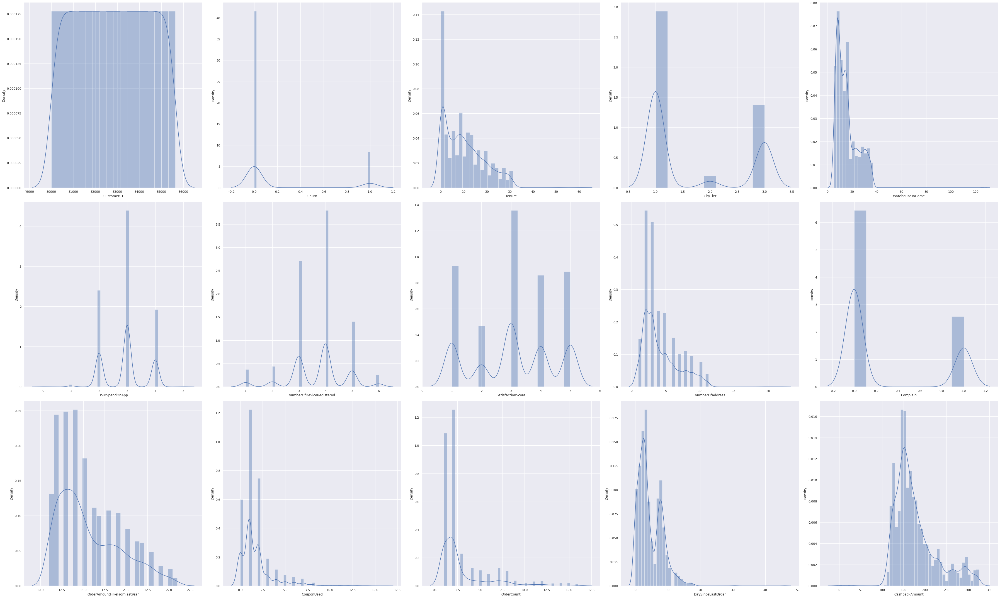

In [261]:
num_var = df_num.columns
fig = plt.subplots(figsize=(50,30))
for i in range(0, len(num_var)):
    plt.subplot(3, int(len(num_var)/3), i+1)
    sns.distplot(df[num_var[i]])
plt.tight_layout()
plt.show()

Interpretasi :
Grafik diatas adalah distribusi setiap features.

Skew positif ▶ Tenure, WarehouseToHome ,NumberOfAddress, OrderAmountHikeFromlastYear,
       CouponUsed, OrderCount, DaySinceLastOrder, CashbackAmount

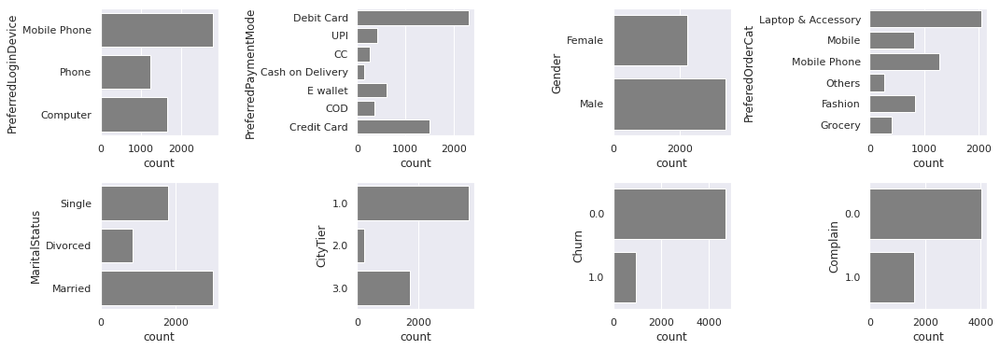

In [262]:
#countplot for categorical
categorical = ['PreferredLoginDevice', 'PreferredPaymentMode', 'Gender',
               'PreferedOrderCat', 'MaritalStatus','CityTier','Churn','Complain']
fig = plt.subplots(figsize=(15,10))
for i in range (0,len(categorical)):
    plt.subplot(4,int(len(categorical)/2),i+1)
    sns.countplot(y=df[categorical[i]],color='gray',orient='v')
plt.tight_layout()

<ul>Individual countplot
<li>ketimpangan antar kategori, terutama pada target</li> sebaran kategori yang timpang merupakan indikasi ketidakgunaan feature. Di Target kalau timpang bisa buat <i>learning</i> gagal.
<li> Terlihat jika sebaran Churn lumayan timpang</li>
</ul>


### Bivariat Analysis — analisis relasi dengan dua variabel yang biasanya dengan target variabel

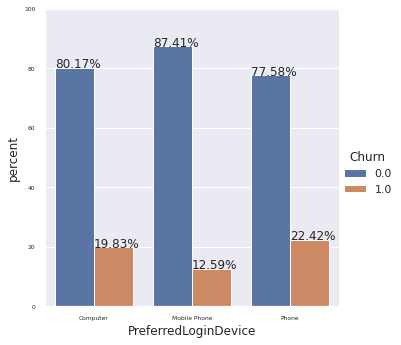

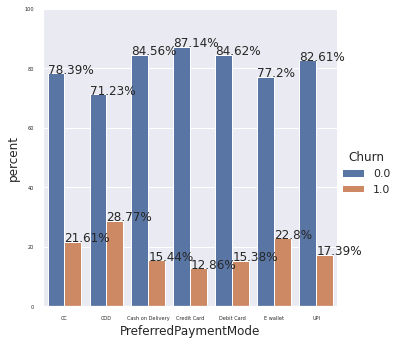

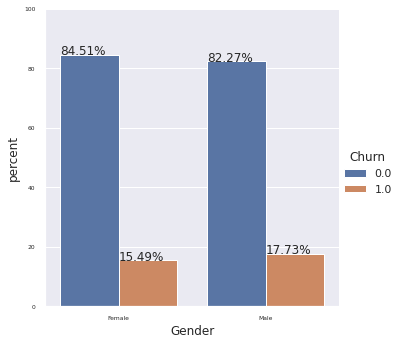

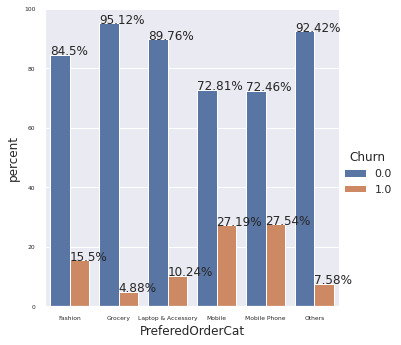

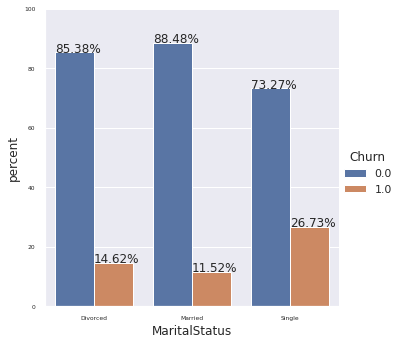

In [263]:
# sebelum duplikat
x, y = 'PreferredLoginDevice', 'Churn'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 6)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt);

x, y = 'PreferredPaymentMode', 'Churn'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 5)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt);
    
x, y = 'Gender', 'Churn'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 6)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt);
    
x, y = 'PreferedOrderCat', 'Churn'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 6)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt);
    
x, y = 'MaritalStatus', 'Churn'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 6)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt);

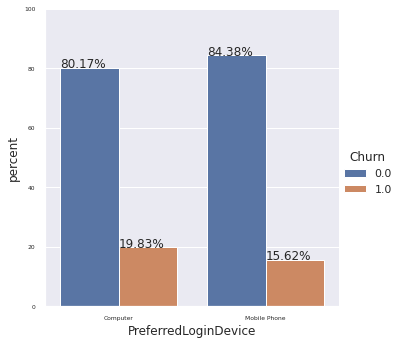

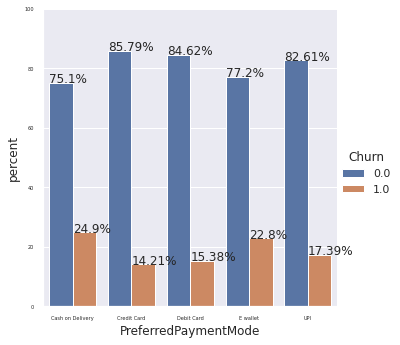

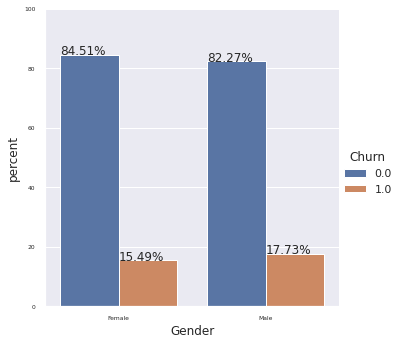

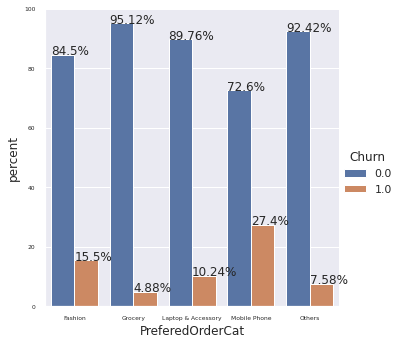

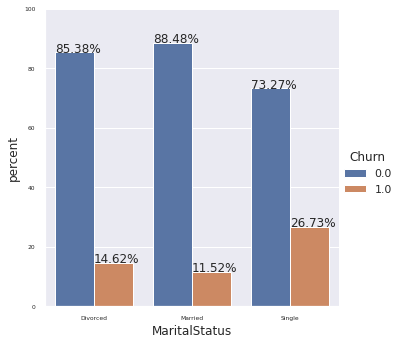

In [264]:
# setelah duplikat
x, y = 'PreferredLoginDevice', 'Churn'

df1 = df_joinduplicate.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 6)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt);

x, y = 'PreferredPaymentMode', 'Churn'

df1 = df_joinduplicate.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 5)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt);
    
x, y = 'Gender', 'Churn'

df1 = df_joinduplicate.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 6)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt);
    
x, y = 'PreferedOrderCat', 'Churn'

df1 = df_joinduplicate.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 6)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt);
    
x, y = 'MaritalStatus', 'Churn'

df1 = df_joinduplicate.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 6)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt);

Interpretasi:
Dari grafik diatas dapat dilihat keterhubungan antara data categorical terhadap target.
Secara keseluruhan dari setiap grafik data categorical memiliki tingkat tidak churn yang lebih tinggi dari pada yang churn

1. PreferredLoginDevice : jumlah tingkat churn setiap kategori sama sama dibawah 500

2. PreferredPaymentMode : Debit card memiliki tingkat churn yang lebih tinggi diantara 7 kategori

3. Gender : memiliki jumlah tingkat churn yang tidak selisih jauh

4. PreferedOrderCat : Mobile Phone memiliki jumlah tingkat churn yang paling tinggi diantara 6 kategori

5. MaritalStatus : divorced adalah kategori dengan jumlah churn paling rendah diantara 3 kategori

*   Pada feature PreferredLoginDevice, ada 2 data yang bisa digabungkan yaitu mobile phone dan phone. Alasan dilakukan penggabungan dikarenakan e-commerce tidak bisa diakses melalui telepon rumah / landline. Sehingga perlu dilakukan agar tidak terjadi duplikasi. Setelah dilakukan penggabungan, perbandingan churn antara login computer dan mobile phone dapat dibedakan yaitu lebih tinggi persentase yang churn dengan menggunakan computer.
*   Pada feature PreferredPaymentMethod, ada 2 data yang bisa digabungkan yaitu credit card dengan cc dan cash on delivery dengan cod.. Alasan dilakukan penggabungan dikarenakan metode pembayaran CC adalah singkatan dari Credit Card, dan COD adalah cash on delivery, sehingga perlu dilakukan agar tidak terjadi duplikasi. Setelah dilakukan penggabungan, perbandingan churn antara masing-masing payment method dapat dibedakan, dan persentase churn tertinggi adalah dengan metode pembayaran cash on delivery.
*   Pada preferred order category juga dilakukan penggabungan pada mobile phone dengan mobile. Diperoleh persentase churn tertinggi pada preferred order mobile phone.

Insight:

Berdasarkan analisis data bivariate, preferred login device, payment method, preferred order dan marital status dapat menjadi faktor kemungkinan penyebab churn, sedangkan untuk gender, persentase churnnya tidak berbeda terlalu jauh. 


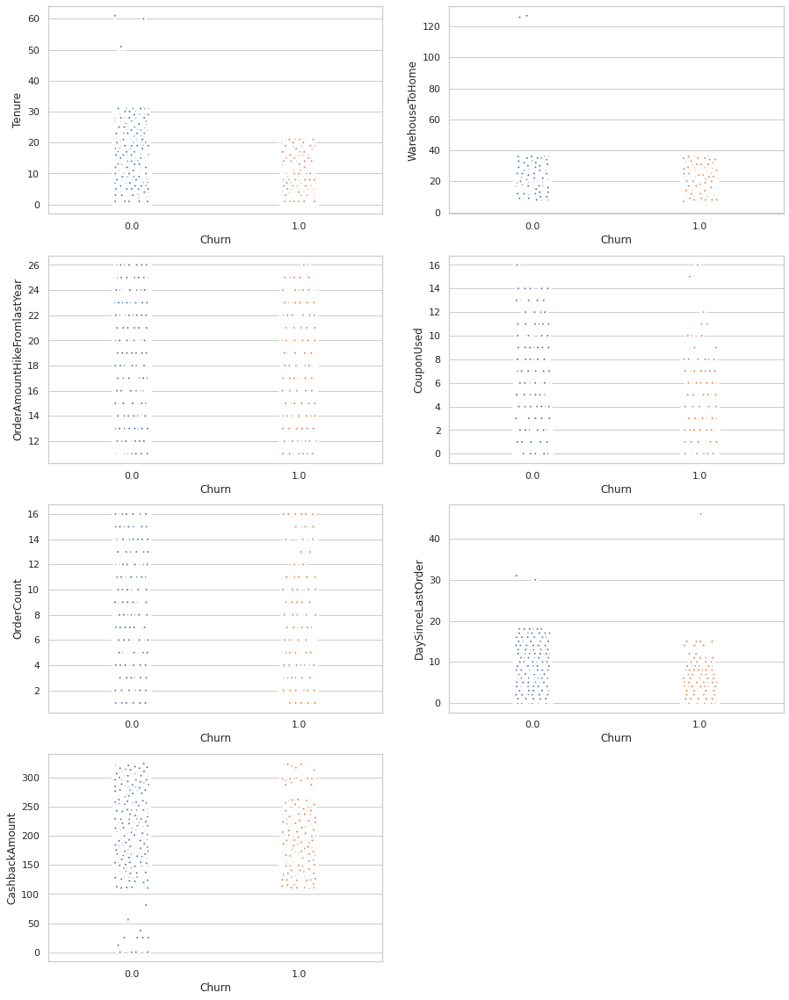

In [265]:
#Data numerical

num = ['Tenure','WarehouseToHome','OrderAmountHikeFromlastYear','CouponUsed','OrderCount',
       'DaySinceLastOrder','CashbackAmount']
fig = plt.subplots(figsize=(15,20))
sns.set(style = 'whitegrid')
for i in range(0, len(num)):
    plt.subplot(4, int(len(num)/3), i+1)
    sns.stripplot(y=df[num[i]], x="Churn", data=df,
                   linewidth=3, edgecolor='white')

Interpretasi :

*   Customer yang churn terdistribusi pada CashbackAmount di atas median nya, dengan kata lain customer yang menerima cashbackamount banyak pun tetap churn
*   Pada warehousetohome, customer yg jarak antara rumah dan warehouse nya paling jauh tidak churn

*   Pada Couponused, customer yang menggunakan coupon paling banyak juga churn








Produt Category dengan Complain

In [266]:
df_joinduplicate=df.copy()
df_joinduplicate['PreferedOrderCat'] = df_joinduplicate['PreferedOrderCat'].replace("Mobile", "Mobile Phone")

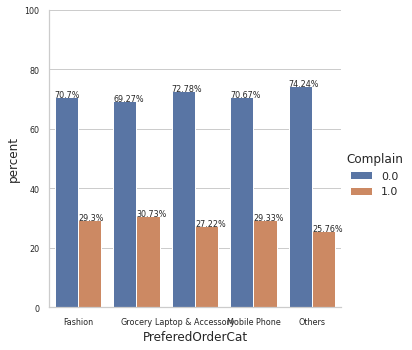

In [267]:
x, y = 'PreferedOrderCat', 'Complain'

df2 = df_joinduplicate.groupby(x)[y].value_counts(normalize=True)
df2 = df2.mul(100)
df2 = df2.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df2)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 8)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt, fontsize=8);

Category grocery adalah category dengan presentase customer yg churn nya paling tinggi

Order Count - Hours Spend on App

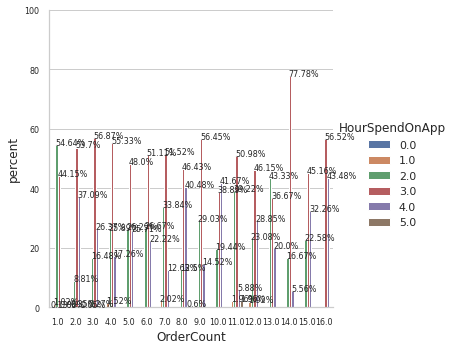

In [268]:
x, y = 'OrderCount', 'HourSpendOnApp'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 8)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt, fontsize=8);

Pada setiap jumlah order count, hoursspendonapp paling tinggi adalah 3 jam

Order Count - Churn

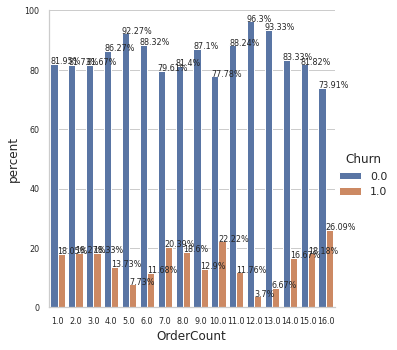

In [269]:
x, y = 'OrderCount', 'Churn'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 8)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt, fontsize=8);

Order count paling banyak (16), presentase churn nya juga paling tinggi (26,09%)

Day Since Last Order - Churn

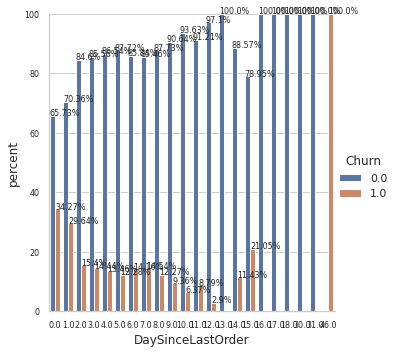

In [270]:
x, y = 'DaySinceLastOrder', 'Churn'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 8)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt, fontsize=8);

Presentase churn paling tinggi adalah pada customer yang daysincelast ordernya jg paling lama, lalu di urutan kedua adalah customer yang daysincelast order nya justru paling sebentar di 0-2 hari

City Tier - Churn

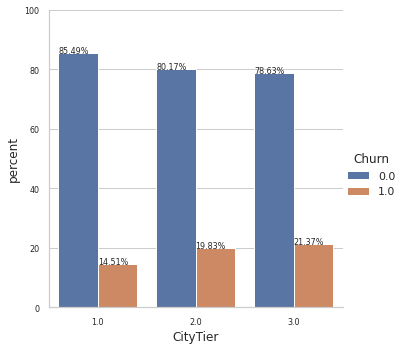

In [271]:
x, y = 'CityTier', 'Churn'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 8)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt, fontsize=8);

City tier paling jauh (kategori 3) memiliki tingkat churn yang paling tinggi

Satisfaction Score - Churn

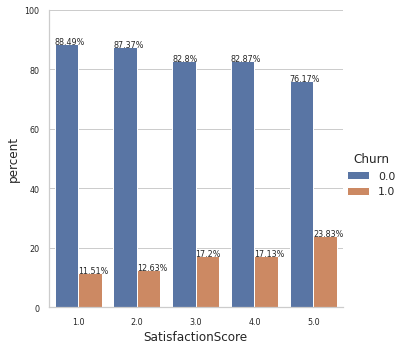

In [272]:
x, y = 'SatisfactionScore', 'Churn'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 8)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt, fontsize=8);

Satisfaction score 5 memiliki tingkat churn yang paling tinggi

Customer who Repeat Order

In [273]:
df4 = df.groupby('CustomerID').agg({'PreferedOrderCat':'unique'})
print(df4)

                PreferedOrderCat
CustomerID                      
50001.0     [Laptop & Accessory]
50002.0                 [Mobile]
50003.0                 [Mobile]
50004.0     [Laptop & Accessory]
50005.0                 [Mobile]
...                          ...
55626.0     [Laptop & Accessory]
55627.0                [Fashion]
55628.0     [Laptop & Accessory]
55629.0     [Laptop & Accessory]
55630.0     [Laptop & Accessory]

[5630 rows x 1 columns]


In [274]:
df[df['CustomerID'].duplicated(keep=False)==True]

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount


In [275]:
df['CustomerID'].duplicated().sum()

0

Dengan tidak adanya duplicate di data customer ID dapat disimpulkan tidak ada customer yang melakukan repeat order dalam tabel ini

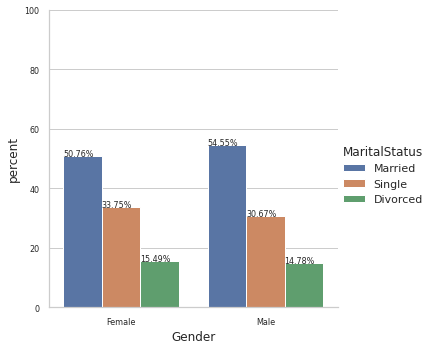

In [276]:
x, y = 'Gender', 'MaritalStatus'

df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)
plt.tick_params(axis = 'both', which='major',labelsize = 8)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt, fontsize=8);

### Multivariate Analysis — analisis yang menggunakan lebih dari atau sama dengan tiga variabel

In [277]:
#heatmap (numerical variable)
df_heatmap=df_num.corr()
df_heatmap

,CustomerID,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
CustomerID,1.000000,-0.019083,0.029952,0.003239,0.058909,0.598417,0.411098,-0.033146,0.160814,-0.009944,0.117243,0.234302,0.139008,0.113243,0.217129
Churn,-0.019083,1.000000,-0.349408,0.084703,0.076630,0.018675,0.107939,0.105481,0.043931,0.250188,-0.010058,-0.008264,-0.028697,-0.160757,-0.154118
Tenure,0.029952,-0.349408,1.000000,-0.060688,-0.018218,-0.021226,-0.023983,-0.013903,0.237666,-0.021268,0.005825,0.129035,0.186403,0.184552,0.476380
CityTier,0.003239,0.084703,-0.060688,1.000000,0.010624,-0.009150,0.027934,-0.011554,-0.029440,0.003375,-0.031408,0.021456,0.033388,0.017525,0.055746
WarehouseToHome,0.058909,0.076630,-0.018218,0.010624,1.000000,0.060990,0.019071,0.007722,-0.011020,0.028696,0.038795,-0.003935,0.002681,0.017829,-0.009200
HourSpendOnApp,0.598417,0.018675,-0.021226,-0.009150,0.060990,1.000000,0.316800,0.031858,0.145126,0.006976,0.106843,0.191528,0.109575,0.075716,0.121490
NumberOfDeviceRegistered,0.411098,0.107939,-0.023983,0.027934,0.019071,0.316800,1.000000,-0.017228,0.084997,0.003407,0.069475,0.151685,0.103464,0.018208,0.137183
SatisfactionScore,-0.033146,0.105481,-0.013903,-0.011554,0.007722,0.031858,-0.017228,1.000000,0.053583,-0.031115,-0.027730,0.017936,0.019764,0.032082,0.003473
NumberOfAddress,0.160814,0.043931,0.237666,-0.029440,-0.011020,0.145126,0.084997,0.053583,1.000000,-0.026399,0.015533,0.042120,-0.007609,-0.064847,0.186688
Complain,-0.009944,0.250188,-0.021268,0.003375,0.028696,0.006976,0.003407,-0.031115,-0.026399,1.000000,-0.004529,-0.008174,-0.019307,-0.043546,0.000525


Text(0.5, 1.0, 'Correlation Feature')

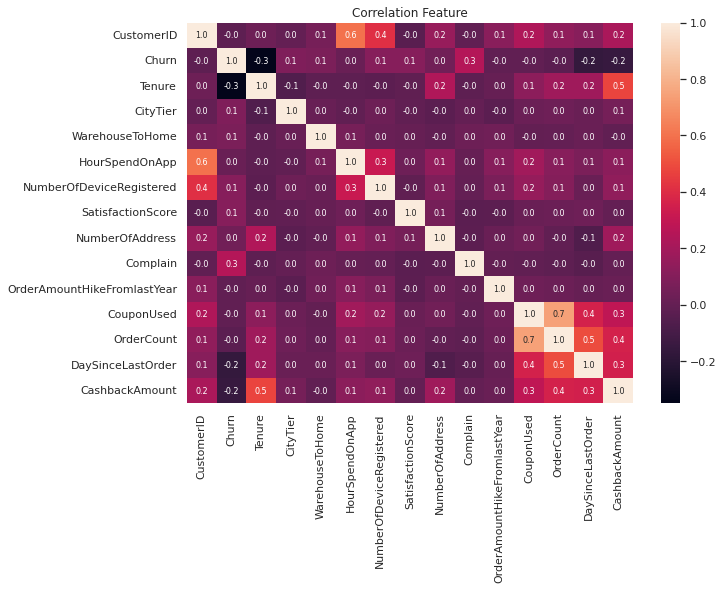

In [278]:
plt.figure(figsize=(10,7))
sns.heatmap(df_heatmap, annot=True, fmt="0.1f", annot_kws={"fontsize":8})
plt.title('Correlation Feature')

Interpretasi :
Heatmap diatas menggambarkan nilai korelasi antar variabel. Dapat dilihat dari tingkat kepekatan warna, semakin terang maka korelasi semakin tinggi. kalo semakin gelap maka korelasi semakin rendah. 

Atau bisa juga korelasi dikatakan sangat kuat jika nilainya melebihi 0.7 jika kurang dari tersebut korelasi antar dua variabel tersebut lemah.

Hanya korelasi antara variabel OrderAccount dan CouponUsed yang mendapat nilai 0.7

<ul>
<li>Apakah feature memiliki korelasi dengan target?</li> feature yang memiliki nilai korelasi paling tinggi dengan target adalah Complain, dengan nilai 0.3

❓ kalau misal ada yang tidak berkolerasi dengan target solusinya apa?
<li>Apakah ada 2 feature yang berkolerasi kuat (>0.7)?</li>Tidak ada yang diatas 0.7, tetapi feature OrderAccount dan CouponUsed mendapat nilai 0.7

<AxesSubplot:xlabel='Tenure', ylabel='CashbackAmount'>

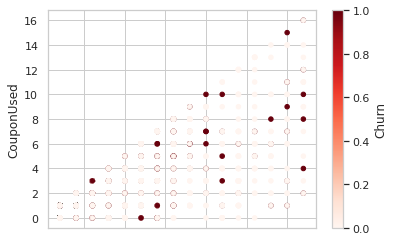

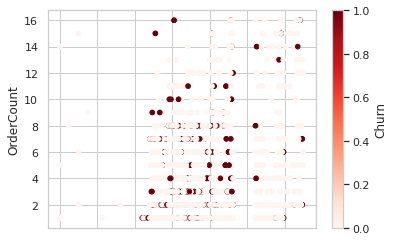

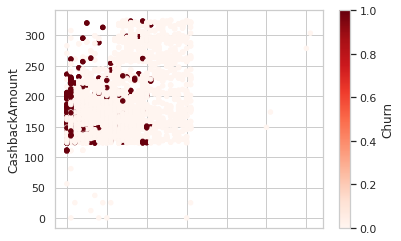

In [279]:
#scatterplot 3 features berdasarkan nilai korelasi pada heatmap
df.plot.scatter(x='OrderCount',y='CouponUsed',c='Churn',cmap='Reds') #0.7
df.plot.scatter(x='CashbackAmount',y='OrderCount',c='Churn',cmap='Reds') #0.4
df.plot.scatter(x='Tenure',y='CashbackAmount',c='Churn',cmap='Reds') #0.5

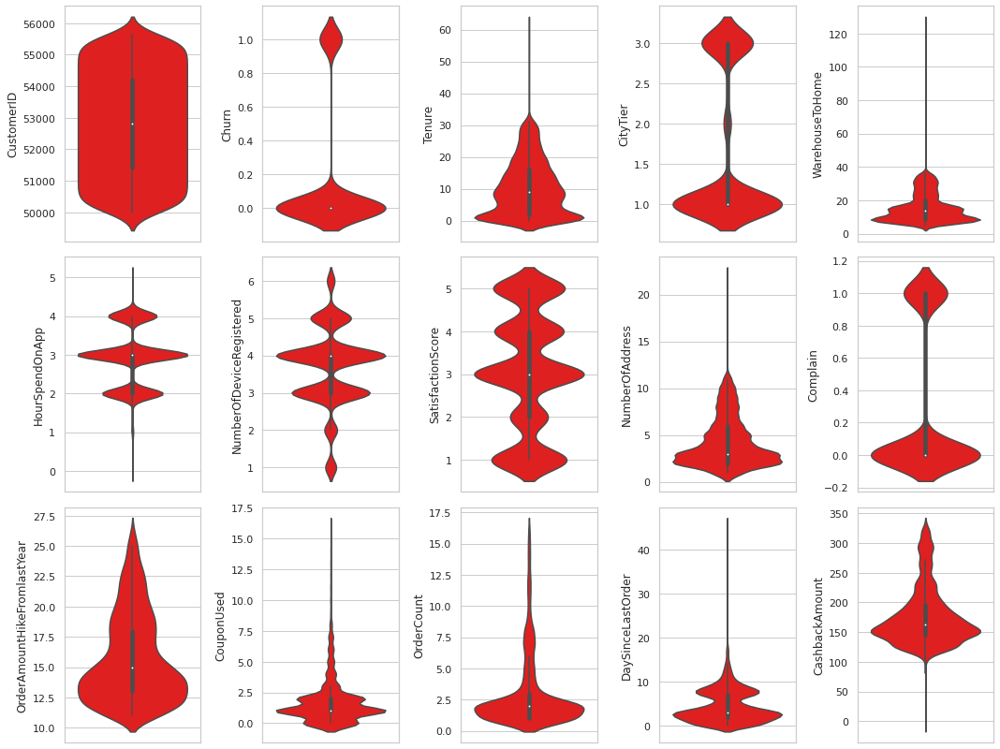

In [280]:
#Violinplot : representation of the distribution.
var=df_num.columns

fig = plt.subplots(figsize=(15,15))
for i in range(0, len(var)):
    plt.subplot(4, int(len(var)/3), i+1)
    sns.violinplot(y=df[var[i]], color='red')
plt.tight_layout()
plt.show()

Interpretasi :
violin plot merupakan gabungan antara bloxplot dan distribution plot

plot diatas adalah violinplot untuk variable numerical

dilihat dari distribusi : 
1. Churn : banyak yang tidak churn 
2. Tenure : kebanyakan ada di 0
3. CityTier : class 1 lebih banyak
4. WarehouseToHome : kebanyakan ada di range 10
5. HourSpendOnApp : lebih banyak di class 3
6. NumberOfDeviceRegistered : lebih banyak di class 4
7. SatisfactionScore : lebih banyak di class 3
8. NumberOfAddress : kebanyakan ada di range 2 atau 3
9. Complain : yg tidak complain lebih banyak
10. OrderAmountHikeFromlastYear : dominasi lebih banyak di range 12.5-15
11. CouponUsed : kebanyakan ada di sekitar 1.5
12. OrderCount : dominasi lebih banyak di range 2-2.5
13. DaySinceLastOrder : lebih banyak di range sekitar 3-4
14. CashbackAmount : dominasi lebih banyak di sekitar 150


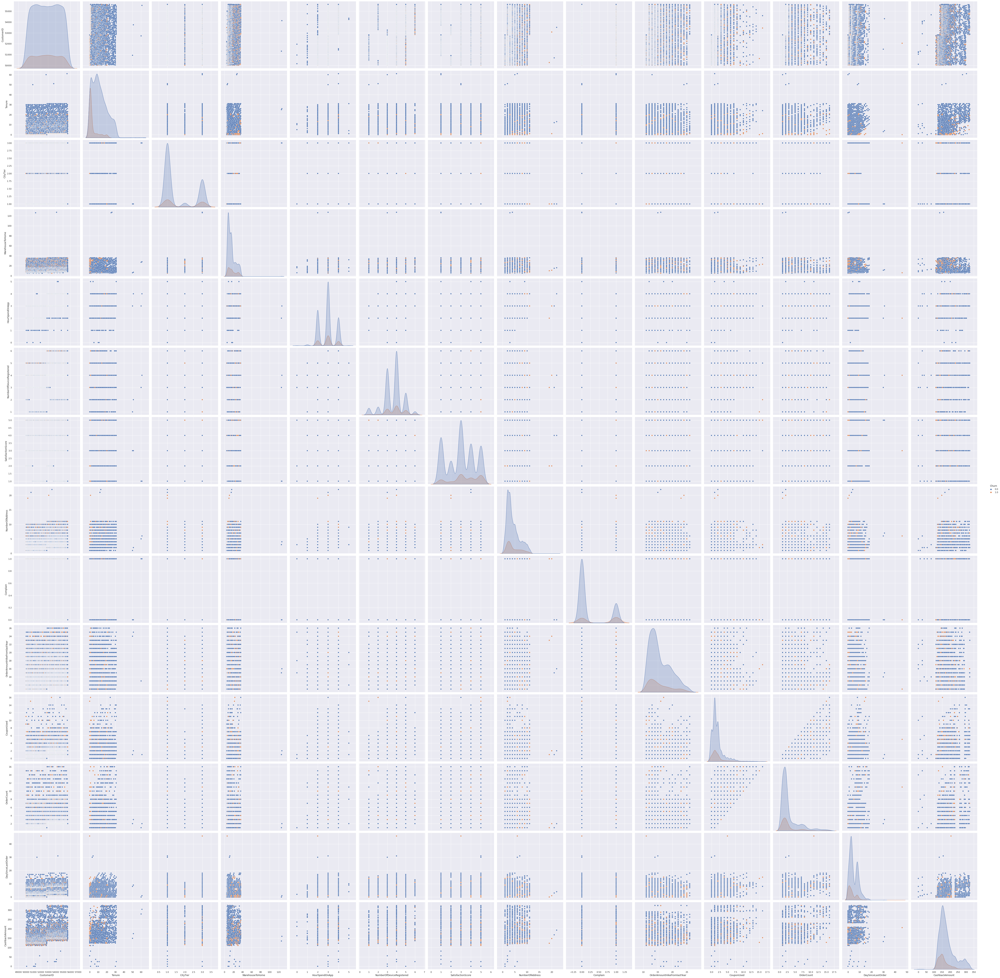

In [281]:
sns.set()
cols=df.columns
sns.pairplot(df[cols],hue='Churn', size=5)
plt.show()

Interpretasi :
Grafik diatas adalah multiple scatterplot antara banyak variable. 

⏺ Positif linear terlihat jelas  antara variabel OrderAccount dan CouponUsed yang mana jika nilai y naik begitupula dengan nilai x

<ul>Memasangkan feature numerik dan kategorikal
<li>Apakah feature categorical memiliki kolerasi dengan target?</li>
<li>Apakah ada 2 feature categorical yang terlihat jelas berkolerasi</li>

### Hypothesis Testing

In [282]:
#membuat dataset copy
ht = df.copy()
ht.head(2)

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001.0,1.0,4.0,Mobile Phone,3.0,6.0,Debit Card,Female,3.0,3.0,Laptop & Accessory,2.0,Single,9.0,1.0,11.0,1.0,1.0,5.0,159.93
1,50002.0,1.0,NaN,Phone,1.0,8.0,UPI,Male,3.0,4.0,Mobile,3.0,Single,7.0,1.0,15.0,0.0,1.0,0.0,120.90


In [283]:
ht.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   float64
 1   Churn                        5630 non-null   float64
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   float64
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   float64
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   float64
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

#### Hyphotesis Testing 1 - Complain

<ul>Hypothesis Testing to Complain
  <li>H0 : Complain not have a significant relationship with Churn</li>
  <li>H1 : Complain have a significant relationship with Churn</li>
</ul>
<i> Level of significance : 5%</i>

In [284]:
def complain (x):
    if x == 1:
        return 'Complained'
    else:   
        return 'No Complain'

In [285]:
def churn (x):
    if x == 1:
        return 'Churn'
    else:
        return 'Not Churn'

In [286]:
ht['Complain'] = ht['Complain'].apply(complain)
ht['Complain'].value_counts()

No Complain    4026
Complained     1604
Name: Complain, dtype: int64

In [287]:
ht['Churn'] = ht['Churn'].apply(churn)
ht['Churn'].value_counts()

Not Churn    4682
Churn         948
Name: Churn, dtype: int64

In [288]:
ht_group = ht.groupby(['Complain','Churn']).agg(user_count=('CustomerID','count')).reset_index()
ht_group

,Complain,Churn,user_count
0,Complained,Churn,508
1,Complained,Not Churn,1096
2,No Complain,Churn,440
3,No Complain,Not Churn,3586


In [289]:
ht_group2 = ht.groupby(['Complain']).agg(total_user=('CustomerID','count')).reset_index()
ht_group2

,Complain,total_user
0,Complained,1604
1,No Complain,4026


In [290]:
group_ratio = ht_group.merge(ht_group2,on='Complain')
group_ratio['Ratio'] = round(group_ratio['user_count']/group_ratio['total_user']*100,2)
group_ratio

,Complain,Churn,user_count,total_user,Ratio
0,Complained,Churn,508,1604,31.67
1,Complained,Not Churn,1096,1604,68.33
2,No Complain,Churn,440,4026,10.93
3,No Complain,Not Churn,3586,4026,89.07


[Text(0, 0, '68.33'), Text(0, 0, '89.07')]

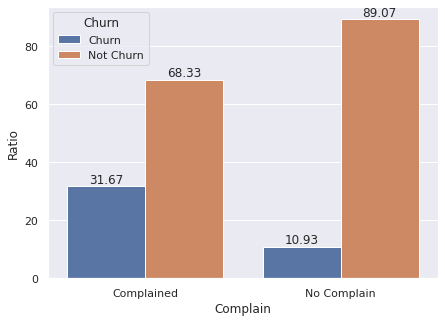

In [291]:
f,ax = plt.subplots(figsize=(7,5))
sns.barplot(data=group_ratio,
            x='Complain',
            y='Ratio',
            hue='Churn')
ax.bar_label(ax.containers[0])
ax.bar_label(ax.containers[1])

##### <b> Chi-Squared Test </b><br>
Because the two variables are categorical.
<ul>
<li>Independence test<br><p align = 'justify'>
The test for independence might be used to asses the association between categorical variables. A chi-squared test for independence might indicate how probable it is that any observed divergence between the actual frequancies in the data and these theoretical predictions can be explained by random chance.</p></li>


Reference : <a href = 'https://analyticsindiamag.com/how-to-use-the-chi-square-test-for-two-categorical-variables/'>How to use the Chi-Squared Test for two categorical variables?</a>

In [292]:
contingency_table = pd.crosstab(df['Churn'],df['Complain'], margins=True)
print('Contingency table :\n', contingency_table)

Contingency table :
 Complain   0.0   1.0   All
Churn                     
0.0       3586  1096  4682
1.0        440   508   948
All       4026  1604  5630


<p align = 'justify'>A contingency table <i>(cross-tabulation or crosstab)</i> is type of table used in statistics to display the relationship between two categorical variables. The table is organized such that each row represents a different category of one variable, and each column represents a different category of the other variable. The intersection of a row and column contains the frequency or count of the cases that belong to both categories.</p>

In [293]:
chi2_stat, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f'Chi Squared Statistic:  {chi2_stat:.5g}')
print('p Value:')
print(round(p_value,2))
print(f'Degree of Freedom:      {dof}')
print(f'Expected Frequencies:\n',expected)

Chi Squared Statistic:  352.41
p Value:
0.0
Degree of Freedom:      4
Expected Frequencies:
 [[3348.08738899 1333.91261101 4682.        ]
 [ 677.91261101  270.08738899  948.        ]
 [4026.         1604.         5630.        ]]


The critical value for the chi-squared test with a degree of freedom of 4 and alpha 0.05 is 9.488. Since the test statistic (352.41) exceeds the critical value, the null hyphotesis is rejected.

<ul>
<li>Goodness of Fit<br><p align = 'justify'>
Determine how well a theoretical model fits the observed data. In this test, the observed frequencies are compared to the expected frequencies, which are calculated from the theorretical model. The test determines if the difference between the observed and expected frequencies is significant</p></li>

In [294]:
obs_values = contingency_table.values
print('Observed Values:\n',obs_values)

Observed Values:
 [[3586 1096 4682]
 [ 440  508  948]
 [4026 1604 5630]]


In [295]:
ev = stats.chi2_contingency(contingency_table)
expected_values = ev[3]
print("Expected Values :\n",expected_values)

Expected Values :
 [[3348.08738899 1333.91261101 4682.        ]
 [ 677.91261101  270.08738899  948.        ]
 [4026.         1604.         5630.        ]]


In [296]:
no_of_rows=len(contingency_table.iloc[0:3,0])
no_of_columns=len(contingency_table.iloc[0,0:2])
degree_of=(no_of_rows-1)*(no_of_columns-1)
print("Degree of Freedom:",degree_of)

Degree of Freedom: 2


In [297]:
chi_square=sum([(o-e)**2./e for o,e in zip(obs_values,expected_values)])
chi_square_statistic=chi_square[0]+chi_square[1]
print("chi-square statistic:",chi_square_statistic)

chi-square statistic: 352.4051364983911


<p align = 'justify'>The critical value for the chi-square test with a degree of freedom of 2 and alpha 0.05 is 5.991. Since the test statistic (352.40) exceeds the critical value, the null hypothesis is rejected. Therefore, Complain and Churn experience have a significant variation in the distribution. This could be concluded that there is a substantial dependency of Complain on relevant experience according to the data.</p>

<b>Conclusion</b>: Reject the null hypothesis, the sample data provides enough evidence to suggest that the null hypothesis is not true</p>

#### Hyphotesys Testing 2 - Tenure

In [298]:
ht[['Tenure']].describe()

,Tenure
count,5366.000000
mean,10.189899
std,8.557241
min,0.000000
25%,2.000000
50%,9.000000
75%,16.000000
max,61.000000


<AxesSubplot:xlabel='Tenure', ylabel='CustomerID'>

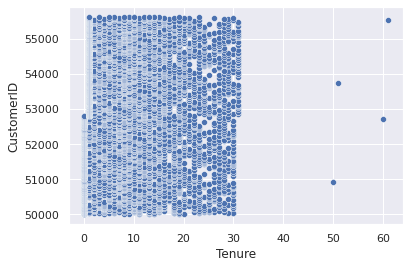

In [299]:
sns.scatterplot(data=ht, x='Tenure', y='CustomerID')

In [300]:
def group(x):
    try:
        if x['Tenure'] <= 2:
            group = 'Low'
        elif x['Tenure'] <= 16:
            group = 'Mid'
        elif x['Tenure'] >16:
            group = 'High'
        else :
            group = None
        return group

    except:
        print['salah input']
        
ht['tenure_group'] = ht.apply(lambda x: group(x), axis=1)

Karena persebaran data yang sedemikian rupa, saya memutuskan untuk mengkategorikan data sebagai berikut:<br>
- Low : data dengan nilai dibawah Q2, <br>
- Mid : data dengan nilai antara Q2 dan Q3, <br>
- High : data dengan nilai di atas Q3.

In [301]:
def group(x):
    try:
        if x['Tenure'] <= ht['Tenure'].quantile(0.5):
            group = 'Low'
        elif (x['Tenure'] >= ht['Tenure'].quantile(0.5)) & (x['Tenure'] <= ht['Tenure'].quantile(0.75)):
            group = 'Mid'
        elif x['Tenure'] > ht['Tenure'].quantile(0.75):
            group = 'High'
        else :
            group = None
        return group

    except:
        print['salah input']
        
ht['tenure_group'] = ht.apply(lambda x: group(x), axis=1)

In [302]:
ht.sample(3)

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,...,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,tenure_group
3677,53678.0,Not Churn,25.0,Computer,3.0,9.0,E wallet,Male,3.0,4.0,...,4.0,Divorced,4.0,No Complain,12.0,1.0,4.0,NaN,230.96,High
5589,55590.0,Not Churn,13.0,Mobile Phone,1.0,31.0,Debit Card,Male,3.0,4.0,...,1.0,Single,9.0,No Complain,14.0,1.0,2.0,8.0,166.08,Mid
2693,52694.0,Not Churn,13.0,Mobile Phone,1.0,7.0,Debit Card,Male,3.0,3.0,...,5.0,Married,3.0,No Complain,11.0,NaN,11.0,16.0,268.23,Mid


In [303]:
csq_tenure = ht.groupby(['tenure_group','Churn']).size().unstack(fill_value=0)
csq_tenure.columns = ['Churn0','Churn1']
csq_tenure

,Churn0,Churn1
tenure_group,,
High,48,1183
Low,741,2140
Mid,78,1176


In [304]:
ct1 = stats.chisquare(csq_tenure['Churn1'])
print('Nilai Statistic Tenure :', ct1.statistic, ', dan',
      'PValue Tenure :', ct1.pvalue)

Nilai Statistic Tenure : 410.13425205601243 , dan PValue Tenure : 8.719242295763977e-90


Nilai statistic tenure adalah 1061.9584775086505 lebih besar dari 7.81 sehingga menolak H0 atau ada hubungan antara masing-masing tenure_group terhadap customer yang churn. Begitu juga Pvalue yang lebih kecil dari 0.05 sehingga dapat mendukung pernyataan tersebut.

Reference : https://van-plaosan.medium.com/uji-chi-square-menggunakan-scipy-stats-di-google-colab-7c686c1ce4bf

#### Hyphotesys Testing 3 - DaySinceLastOrder

In [305]:
ht[['DaySinceLastOrder']].describe()

,DaySinceLastOrder
count,5323.000000
mean,4.543491
std,3.654433
min,0.000000
25%,2.000000
50%,3.000000
75%,7.000000
max,46.000000


In [306]:
def group(x):
    try:
        if x['DaySinceLastOrder'] <= 2:
            group = 'early'
        elif x['DaySinceLastOrder'] > 7:
            group = 'longtime'
        else :
            group = None
        return group

    except:
        print['salah input']
        
ht['period'] = ht.apply(lambda x: group(x), axis=1)

Saya mengelompokkan data DaySinceLastOrder menjadi 2 bagian, sehingga saya membaginya menjadi 2 kelompok, sebagai berikut: <br>
- early : data yang bernilai di bawah Q2, <br>
- longtime : data yang bernilai di atas Q2. 

In [307]:
def group(x):
    try:
        if x['DaySinceLastOrder'] <= ht['DaySinceLastOrder'].quantile(0.5):
            group = 'early'
        elif x['DaySinceLastOrder'] > ht['DaySinceLastOrder'].quantile(0.5):
            group = 'longtime'
        else :
            group = None
        return group

    except:
        print['salah input']
ht['period'] = ht.apply(lambda x: group(x), axis=1)

In [308]:
ht.sample(5)

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,...,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,tenure_group,period
3806,53807.0,Not Churn,29.0,Mobile Phone,3.0,33.0,E wallet,Male,3.0,5.0,...,Married,3.0,No Complain,NaN,3.0,3.0,14.0,320.86,High,longtime
376,50377.0,Not Churn,NaN,Computer,1.0,9.0,CC,Female,3.0,3.0,...,Married,2.0,No Complain,20.0,1.0,1.0,0.0,120.83,None,early
4096,54097.0,Not Churn,28.0,Mobile Phone,1.0,17.0,Credit Card,Female,4.0,4.0,...,Single,8.0,Complained,20.0,1.0,2.0,5.0,169.40,High,longtime
1264,51265.0,Not Churn,4.0,Computer,1.0,6.0,Debit Card,Male,2.0,5.0,...,Married,2.0,No Complain,21.0,1.0,8.0,7.0,150.03,Low,longtime
250,50251.0,Not Churn,22.0,Phone,1.0,13.0,UPI,Male,2.0,4.0,...,Single,9.0,No Complain,24.0,1.0,1.0,0.0,145.00,High,early


In [309]:
csq_DSLO = ht.groupby(['period','Churn']).size().unstack(fill_value=0)
csq_DSLO.columns = ['Churn0', 'Churn1']
csq_DSLO

,Churn0,Churn1
period,,
early,604,2198
longtime,290,2231


In [310]:
cd1 = stats.chisquare(csq_DSLO['Churn1'])
print('Nilai Statistic DaySinceLastOrder  :', cd1.statistic, ', dan',
      'PValue DaySinceLastOrder :', cd1.pvalue)

Nilai Statistic DaySinceLastOrder  : 0.24587943102280424 , dan PValue DaySinceLastOrder : 0.6199915589451542


Nilai statistic tenure adalah 110.28635346756153 lebih besar dari 7.81 sehingga menolak H0 atau ada hubungan antara masing-masing period terhadap customer yang churn. Begitu juga Pvalue yang lebih kecil dari 0.05 sehingga dapat mendukung pernyataan tersebut.

Reference : https://van-plaosan.medium.com/uji-chi-square-menggunakan-scipy-stats-di-google-colab-7c686c1ce4bf

#### Hyphotesys Testing 4 - Satisfaction

Hypothesis Testing to Complain<br>
H0 : Satisfaction score do not have a significant relationship with Churn<br>
H1 : Satisfaction score have a significant relationship with Churn <br>
<i> Level of significance : 5%</i>

In [311]:
ht[['SatisfactionScore']].describe()

,SatisfactionScore
count,5630.000000
mean,3.066785
std,1.380194
min,1.000000
25%,2.000000
50%,3.000000
75%,4.000000
max,5.000000


In [312]:
def group(x):
    try:
        if x['SatisfactionScore'] <= 2:
            group = 'Not Satisfy'
        elif x['SatisfactionScore'] <=3:
            group = 'Netral'
        elif x['SatisfactionScore'] >=4:
            group = 'Satisfy'
        else :
            group = None
        return group

    except:
        print['salah input']
        
ht['Satisfaction_category'] = ht.apply(lambda x: group(x), axis=1)

In [313]:
ht.sample(5)

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,...,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,tenure_group,period,Satisfaction_category
1026,51027.0,Not Churn,1.0,Mobile Phone,1.0,33.0,Credit Card,Female,2.0,5.0,...,1.0,No Complain,21.0,1.0,1.0,0.0,0.00,Low,early,Satisfy
4338,54339.0,Not Churn,20.0,Mobile Phone,3.0,7.0,E wallet,Female,4.0,4.0,...,3.0,No Complain,26.0,9.0,16.0,NaN,229.53,High,None,Satisfy
3662,53663.0,Not Churn,1.0,Computer,1.0,7.0,Debit Card,Female,4.0,4.0,...,3.0,No Complain,16.0,2.0,2.0,1.0,141.11,Low,early,Not Satisfy
3019,53020.0,Not Churn,21.0,Mobile Phone,1.0,12.0,Debit Card,Male,3.0,4.0,...,6.0,No Complain,NaN,1.0,2.0,2.0,308.00,High,early,Netral
3407,53408.0,Not Churn,1.0,Mobile Phone,1.0,23.0,COD,Female,3.0,4.0,...,11.0,No Complain,15.0,3.0,3.0,3.0,153.11,Low,early,Satisfy


In [314]:
ht_group3 = ht.groupby(['Satisfaction_category','Churn']).agg(user_count=('CustomerID','count')).reset_index()
ht_group3

,Satisfaction_category,Churn,user_count
0,Netral,Churn,292
1,Netral,Not Churn,1406
2,Not Satisfy,Churn,208
3,Not Satisfy,Not Churn,1542
4,Satisfy,Churn,448
5,Satisfy,Not Churn,1734


In [315]:
ht_group4 = ht.groupby(['Satisfaction_category']).agg(total_user=('CustomerID','count')).reset_index()
ht_group4

,Satisfaction_category,total_user
0,Netral,1698
1,Not Satisfy,1750
2,Satisfy,2182


In [316]:
group_ratio1 = ht_group3.merge(ht_group4,on='Satisfaction_category')
group_ratio1['Ratio'] = round(group_ratio1['user_count']/group_ratio1['total_user']*100,2)
group_ratio1

,Satisfaction_category,Churn,user_count,total_user,Ratio
0,Netral,Churn,292,1698,17.20
1,Netral,Not Churn,1406,1698,82.80
2,Not Satisfy,Churn,208,1750,11.89
3,Not Satisfy,Not Churn,1542,1750,88.11
4,Satisfy,Churn,448,2182,20.53
5,Satisfy,Not Churn,1734,2182,79.47


In [317]:
contingency_table1 = pd.crosstab(df['Churn'],ht['Satisfaction_category'], margins=True)
print('Contingency table :\n', contingency_table1)

Contingency table :
 Satisfaction_category  Netral  Not Satisfy  Satisfy   All
Churn                                                    
0.0                      1406         1542     1734  4682
1.0                       292          208      448   948
All                      1698         1750     2182  5630


In [318]:
chi2_stat, p_value, dof, expected = stats.chi2_contingency(contingency_table1)
print(f'Chi Squared Statistic:  {chi2_stat:.5g}')
print('p Value:')
print(round(p_value,2))
print(f'Degree of Freedom:      {dof}')
print(f'Expected Frequencies:\n',expected)

Chi Squared Statistic:  52.064
p Value:
0.0
Degree of Freedom:      6
Expected Frequencies:
 [[1412.08454707 1455.3285968  1814.58685613 4682.        ]
 [ 285.91545293  294.6714032   367.41314387  948.        ]
 [1698.         1750.         2182.         5630.        ]]


The critical value for the chi-squared test with a degree of freedom of 6 and alpha 0.05 is 10.645. Since the test statistic (52.064) exceeds the critical value, the null hyphotesis is rejected.

Conclusion: Reject the null hypothesis, the sample data provides enough evidence to suggest that the null hypothesis is not true. Therefore, Satisfaction score and churn have a significant variation in the distribution. This could be concluded that there is a substantial dependency of satisfaction score on relevant experience according to the data.

#### Hipotesis Testing 5 - Cashback Amount

<ul>Hypothesis Testing to Complain
  <li>H0 : CashbackAmount do not have a significant relationship with Churn</li>
  <li>H1 : CashbackAmount have a significant relationship with Churn</li>
</ul>
<i> Level of significance : 5%</i>

In [319]:
ht[['CashbackAmount']].describe()

,CashbackAmount
count,5630.000000
mean,177.223030
std,49.207036
min,0.000000
25%,145.770000
50%,163.280000
75%,196.392500
max,324.990000


In [320]:
def group(x):
    try:
        if x['CashbackAmount'] <= 145.770000:
            group = 'Not Much'
        elif (x['CashbackAmount'] > 145.770000) & (x['CashbackAmount'] < 196.392500):
            group = 'Mid'
        elif x['CashbackAmount'] >=196.392500:
            group = 'A lot'
        else :
            group = None
        return group

    except:
        print['salah input']
        
ht['cashback_category'] = ht.apply(lambda x: group(x), axis=1)

In [321]:
ht.sample(5)

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,...,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,tenure_group,period,Satisfaction_category,cashback_category
1368,51369.0,Not Churn,NaN,Mobile Phone,1.0,21.0,Debit Card,Male,3.0,3.0,...,No Complain,14.0,1.0,1.0,0.0,112.32,None,early,Not Satisfy,Not Much
754,50755.0,Not Churn,30.0,Mobile Phone,3.0,13.0,E wallet,Male,2.0,1.0,...,Complained,18.0,0.0,1.0,9.0,152.20,High,longtime,Not Satisfy,Mid
2945,52946.0,Not Churn,1.0,Mobile Phone,1.0,7.0,Debit Card,Female,4.0,4.0,...,No Complain,13.0,2.0,2.0,3.0,173.98,Low,early,Netral,Mid
5460,55461.0,Not Churn,8.0,Mobile Phone,3.0,15.0,Cash on Delivery,Male,4.0,2.0,...,No Complain,22.0,3.0,5.0,9.0,192.99,Low,longtime,Netral,Mid
5152,55153.0,Not Churn,13.0,Computer,1.0,32.0,Debit Card,Male,4.0,4.0,...,No Complain,22.0,1.0,NaN,6.0,234.20,Mid,longtime,Netral,A lot


In [322]:
ht_group5 = ht.groupby(['cashback_category','Churn']).agg(user_count=('CustomerID','count')).reset_index()
ht_group5

,cashback_category,Churn,user_count
0,A lot,Churn,154
1,A lot,Not Churn,1254
2,Mid,Churn,440
3,Mid,Not Churn,2373
4,Not Much,Churn,354
5,Not Much,Not Churn,1055


In [323]:
ht_group6 = ht.groupby(['cashback_category']).agg(total_user=('CustomerID','count')).reset_index()
ht_group6

,cashback_category,total_user
0,A lot,1408
1,Mid,2813
2,Not Much,1409


In [324]:
group_ratio3 = ht_group5.merge(ht_group6,on='cashback_category')
group_ratio3['Ratio'] = round(group_ratio3['user_count']/group_ratio3['total_user']*100,2)
group_ratio3

,cashback_category,Churn,user_count,total_user,Ratio
0,A lot,Churn,154,1408,10.94
1,A lot,Not Churn,1254,1408,89.06
2,Mid,Churn,440,2813,15.64
3,Mid,Not Churn,2373,2813,84.36
4,Not Much,Churn,354,1409,25.12
5,Not Much,Not Churn,1055,1409,74.88


In [325]:
contingency_table2 = pd.crosstab(df['Churn'],ht['cashback_category'], margins=True)
print('Contingency table :\n', contingency_table2)

Contingency table :
 cashback_category  A lot   Mid  Not Much   All
Churn                                         
0.0                 1254  2373      1055  4682
1.0                  154   440       354   948
All                 1408  2813      1409  5630


In [326]:
chi2_stat, p_value, dof, expected = stats.chi2_contingency(contingency_table2)
print(f'Chi Squared Statistic:  {chi2_stat:.5g}')
print('p Value:')
print(round(p_value,2))
print(f'Degree of Freedom:      {dof}')
print(f'Expected Frequencies:\n',expected)

Chi Squared Statistic:  106.97
p Value:
0.0
Degree of Freedom:      6
Expected Frequencies:
 [[1170.91580817 2339.33676732 1171.74742451 4682.        ]
 [ 237.08419183  473.66323268  237.25257549  948.        ]
 [1408.         2813.         1409.         5630.        ]]


The critical value for the chi-square test with a degree of freedom of 6 and alpha 0.05 is 12.592. Since the test statistic (106.97) exceeds the critical value the null hypothesis is rejected. 

Conclusion: Reject the null hypothesis, the sample data provides enough evidence to suggest that the null hypothesis is not true. Therefore, cashback amount and churn have a significant variation in the distribution. This could be concluded that there is a substantial dependency of cashback amount on relevant experience according to the data.

#### Hypotesis Testing 6 - City Tier

In [327]:
ht[['CityTier']].describe()

,CityTier
count,5630.000000
mean,1.654707
std,0.915389
min,1.000000
25%,1.000000
50%,1.000000
75%,3.000000
max,3.000000


In [328]:
def group(x):
    try:
        if x['CityTier'] <= 1:
            group = 'Small Population'
        elif x['CityTier'] <= 2:
            group = 'Medium Population '
        elif x['CityTier'] >= 3:
            group = 'Big Population'
        else :
            group = None
        return group

    except:
        print['salah input']
        
ht['City_Tier_Category'] = ht.apply(lambda x: group(x), axis=1)

In [329]:
csq_citytier = ht.groupby(['City_Tier_Category','Churn']).size().unstack(fill_value=0)
csq_citytier.columns = ['Churn0','Churn1']
csq_citytier

,Churn0,Churn1
City_Tier_Category,,
Big Population,368,1354
Medium Population,48,194
Small Population,532,3134


In [330]:
contingency_table2= pd.crosstab(df['CityTier'],df['Churn'], margins=True)
print('Contingency table :\n', contingency_table2)

Contingency table :
 Churn      0.0  1.0   All
CityTier                 
1.0       3134  532  3666
2.0        194   48   242
3.0       1354  368  1722
All       4682  948  5630


In [331]:
chi2_stat, p_value, dof, expected = stats.chi2_contingency(contingency_table2)
print(f'Chi Squared Statistic:  {chi2_stat:.5g}')
print('p Value:')
print(round(p_value,2))
print(f'Degree of Freedom:      {dof}')
print(f'Expected Frequencies:\n',expected)

Chi Squared Statistic:  40.982
p Value:
0.0
Degree of Freedom:      6
Expected Frequencies:
 [[3048.70550622  617.29449378 3666.        ]
 [ 201.25115453   40.74884547  242.        ]
 [1432.04333925  289.95666075 1722.        ]
 [4682.          948.         5630.        ]]


In [332]:
obs_values = contingency_table2.values
print('Observed Values:\n',obs_values)

Observed Values:
 [[3134  532 3666]
 [ 194   48  242]
 [1354  368 1722]
 [4682  948 5630]]


In [333]:
ev = stats.chi2_contingency(contingency_table2)
expected_values = ev[3]
print("Expected Values :\n",expected_values)

Expected Values :
 [[3048.70550622  617.29449378 3666.        ]
 [ 201.25115453   40.74884547  242.        ]
 [1432.04333925  289.95666075 1722.        ]
 [4682.          948.         5630.        ]]


In [334]:
no_of_rows=len(contingency_table2.iloc[0:4,0])
no_of_columns=len(contingency_table2.iloc[0,0:3])
degree_of=(no_of_rows-1)*(no_of_columns-1)
print("Degree of Freedom:",degree_of)

Degree of Freedom: 6


In [335]:
chi_square=sum([(o-e)**2./e for o,e in zip(obs_values,expected_values)])
chi_square_statistic=chi_square[0]+chi_square[1]
print("chi-square statistic:",chi_square_statistic)

chi-square statistic: 40.982404247736355


The critical value for the chi-squared test with a degree of freedom of 6 and alpha 0.05 is 10.645. Since the test statistic (40.982) exceeds the critical value, the null hyphotesis is rejected.
Therefore, City_Tier and churn have a significant variation in the distribution.This could be concluded that there is a substantial dependency of City_Tier on relevant experience according to the data.


#### Hypotesis Testing 7 - Warehouse To Home

In [336]:
ht[['WarehouseToHome']].describe()

,WarehouseToHome
count,5379.000000
mean,15.639896
std,8.531475
min,5.000000
25%,9.000000
50%,14.000000
75%,20.000000
max,127.000000


In [337]:
def group(x):
    try:
        if x['WarehouseToHome'] <= ht['WarehouseToHome'].quantile(0.5):
            group = 'Close'
        elif (x['WarehouseToHome'] >= ht['WarehouseToHome'].quantile(0.5)) & (x['WarehouseToHome'] <= ht['WarehouseToHome'].quantile(0.75)):
            group = 'Near'
        elif x['WarehouseToHome'] > ht['WarehouseToHome'].quantile(0.75):
            group = 'Far'
        else :
            group = None
        return group

    except:
        print['salah input']
        
ht['warehouse_to_home_distance'] = ht.apply(lambda x: group(x), axis=1)

In [338]:
ht.sample(3)

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,...,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,tenure_group,period,Satisfaction_category,cashback_category,City_Tier_Category,warehouse_to_home_distance
3682,53683.0,Not Churn,13.0,Computer,1.0,32.0,Debit Card,Male,4.0,4.0,...,1.0,NaN,6.0,234.20,Mid,longtime,Netral,A lot,Small Population,Far
66,50067.0,Not Churn,NaN,Phone,1.0,15.0,CC,Female,2.0,3.0,...,1.0,1.0,3.0,122.79,None,early,Satisfy,Not Much,Small Population,Near
714,50715.0,Not Churn,15.0,Mobile Phone,3.0,10.0,E wallet,Male,2.0,3.0,...,1.0,1.0,5.0,151.55,Mid,longtime,Satisfy,Mid,Big Population,Close


In [339]:
csq_wthome = ht.groupby(['warehouse_to_home_distance','Churn']).size().unstack(fill_value=0)
csq_wthome.columns = ['Churn0','Churn1']
csq_wthome

,Churn0,Churn1
warehouse_to_home_distance,,
Close,398,2573
Far,274,1069
Near,192,873


In [340]:
ct1 = stats.chisquare(csq_wthome['Churn1'])
print('Nilai Statistic Warehouse To Home :', ct1.statistic, ', dan',
      'PValue Warehouse To Home :', ct1.pvalue)

Nilai Statistic Warehouse To Home : 1149.597342192691 , dan PValue Warehouse To Home : 2.334043455520227e-250


Nilai statistic Warehouse To Home adalah 1149.597342192691 lebih besar dari 5.991 sehingga menolak H0 atau ada hubungan antara masing-masing jarak terhadap customer yang churn. Begitu juga Pvalue yang lebih kecil dari 0.05 sehingga dapat mendukung pernyataan tersebut.

<ul><b>Poin-poin yang harus diperhatikan untuk stage selanjutnya:</b><br>
<li>Mengganti tipe data yang janggal</li>
<li>Ada redundan</li>
<li>Menangani outlier pada kolom

# Data Pre-Processing <br>

<li>Missing Data</li>
<li>Duplicated Data</li>
<li>Outliers</li>
<li>Feature Transformation</li>
<li>Feature Encoding</li>
<li>Class Imbalance</li>

## Handling Duplicated Data 

In [341]:
def string_replace(df, columns, replaced):
    for col in df.columns:
        df[col] = df[col].replace(replaced)
    return df

In [342]:
replaced = {'Phone' : 'Mobile Phone',
            'Mobile' : 'Mobile Phone',
            'COD' : 'Cash on Delivery',
            'CC' : 'Credit Card'}

In [343]:
df = string_replace(df, ['PreferredLoginDevice',
                         'PreferredPaymentMode',
                         'PreferedOrderCat'],
                   replaced)

In [344]:
df['PreferredLoginDevice'].value_counts()

Mobile Phone    3996
Computer        1634
Name: PreferredLoginDevice, dtype: int64

In [345]:
df.isna().sum()

CustomerID                       0
Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

In [346]:
df

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001.0,1.0,4.0,Mobile Phone,3.0,6.0,Debit Card,Female,3.0,3.0,Laptop & Accessory,2.0,Single,9.0,1.0,11.0,1.0,1.0,5.0,159.93
1,50002.0,1.0,NaN,Mobile Phone,1.0,8.0,UPI,Male,3.0,4.0,Mobile Phone,3.0,Single,7.0,1.0,15.0,0.0,1.0,0.0,120.90
2,50003.0,1.0,NaN,Mobile Phone,1.0,30.0,Debit Card,Male,2.0,4.0,Mobile Phone,3.0,Single,6.0,1.0,14.0,0.0,1.0,3.0,120.28
3,50004.0,1.0,0.0,Mobile Phone,3.0,15.0,Debit Card,Male,2.0,4.0,Laptop & Accessory,5.0,Single,8.0,0.0,23.0,0.0,1.0,3.0,134.07
4,50005.0,1.0,0.0,Mobile Phone,1.0,12.0,Credit Card,Male,NaN,3.0,Mobile Phone,5.0,Single,3.0,0.0,11.0,1.0,1.0,3.0,129.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,55626.0,0.0,10.0,Computer,1.0,30.0,Credit Card,Male,3.0,2.0,Laptop & Accessory,1.0,Married,6.0,0.0,18.0,1.0,2.0,4.0,150.71
5626,55627.0,0.0,13.0,Mobile Phone,1.0,13.0,Credit Card,Male,3.0,5.0,Fashion,5.0,Married,6.0,0.0,16.0,1.0,2.0,NaN,224.91
5627,55628.0,0.0,1.0,Mobile Phone,1.0,11.0,Debit Card,Male,3.0,2.0,Laptop & Accessory,4.0,Married,3.0,1.0,21.0,1.0,2.0,4.0,186.42
5628,55629.0,0.0,23.0,Computer,3.0,9.0,Credit Card,Male,4.0,5.0,Laptop & Accessory,4.0,Married,4.0,0.0,15.0,2.0,2.0,9.0,178.90


In [347]:
df.count()

CustomerID                     5630
Churn                          5630
Tenure                         5366
PreferredLoginDevice           5630
CityTier                       5630
WarehouseToHome                5379
PreferredPaymentMode           5630
Gender                         5630
HourSpendOnApp                 5375
NumberOfDeviceRegistered       5630
PreferedOrderCat               5630
SatisfactionScore              5630
MaritalStatus                  5630
NumberOfAddress                5630
Complain                       5630
OrderAmountHikeFromlastYear    5365
CouponUsed                     5374
OrderCount                     5372
DaySinceLastOrder              5323
CashbackAmount                 5630
dtype: int64

In [348]:
df.duplicated(subset=['CustomerID','Tenure'])

0       False
1       False
2       False
3       False
4       False
        ...  
5625    False
5626    False
5627    False
5628    False
5629    False
Length: 5630, dtype: bool

In [349]:
df.duplicated(subset=['CustomerID','Tenure']).sum()

0

## Handling Missing Data

In [350]:
df.isna().sum()

CustomerID                       0
Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

### Tenure

In [351]:
df['Tenure'] = df['Tenure'].fillna(df['Tenure'].median())
df = df.reset_index()
print(df['Tenure'])

0        4.0
1        9.0
2        9.0
3        0.0
4        0.0
        ... 
5625    10.0
5626    13.0
5627     1.0
5628    23.0
5629     8.0
Name: Tenure, Length: 5630, dtype: float64


Missing value pada feature Tenure tidak didrop meskipun presentasenya <10% sebab ada 81 data Tenure yang NaN dan Churn nya 1, kalau didrop data yang Churnnya 1 akan semakin sedikit mengingat data yang memiliki nilai 1 di Churn hanya 18% dari total data di feature Churn. Nilai Median dipilih untuk mengisi missing value agar distribusi data nya terjaga tetap normal

### WarehouseToHome

In [352]:
df['WarehouseToHome'] = df['WarehouseToHome'].fillna(df['WarehouseToHome'].median())
df = df.reset_index()
print(df['WarehouseToHome'])

0        6.0
1        8.0
2       30.0
3       15.0
4       12.0
        ... 
5625    30.0
5626    13.0
5627    11.0
5628     9.0
5629    15.0
Name: WarehouseToHome, Length: 5630, dtype: float64


Ada 251 data WarehouseToHome yang missing dan 84 di antaranya adalah Customer yang Churn (Churn = 1) sehingga kami tidak memilih untuk mendrop datanya karena dikhawatirkan data yg Churn = 1 akan semakin sedikit sehingga kami memilih untuk mengisi data yg missing. Nilai median dipilih untuk mengisi missing value dimaksudkan agar data nya tetap terdistribusi normal

### HourSpendOnApp

In [353]:
df['HourSpendOnApp'] = df['HourSpendOnApp'].fillna(df['HourSpendOnApp'].mean())
df = df.reset_index(drop=True)
print(df['HourSpendOnApp'])

0       3.000000
1       3.000000
2       2.000000
3       2.000000
4       2.931535
          ...   
5625    3.000000
5626    3.000000
5627    3.000000
5628    4.000000
5629    3.000000
Name: HourSpendOnApp, Length: 5630, dtype: float64


Ada 255 data HourSpendonApp yang missing dan 58 di antaranya adalah Customer yang Churn (Churn = 1) sehingga kami tidak memilih untuk mendrop datanya karena dikhawatirkan data yg Churn = 1 akan semakin sedikit sehingga kami memilih untuk mengisi data yg missing. Nilai median dipilih untuk mengisi missing value dimaksudkan agar data nya tetap terdistribusi normal

### OrderAmountHikeFromLastYear

In [354]:
df['OrderAmountHikeFromlastYear'] = df['OrderAmountHikeFromlastYear'].fillna(df['OrderAmountHikeFromlastYear'].median())
df = df.reset_index(drop=True)
print(df['OrderAmountHikeFromlastYear'])

0       11.0
1       15.0
2       14.0
3       23.0
4       11.0
        ... 
5625    18.0
5626    16.0
5627    21.0
5628    15.0
5629    13.0
Name: OrderAmountHikeFromlastYear, Length: 5630, dtype: float64


Ada 251 data OrderAmountHikeFromlastYear yang missing dan 14 di antaranya adalah Customer yang Churn (Churn = 1) sehingga kami tidak memilih untuk mendrop datanya karena dikhawatirkan data yg Churn = 1 akan semakin sedikit sehingga kami memilih untuk mengisi data yg missing. Nilai median dipilih untuk mengisi missing value dimaksudkan agar data nya tetap terdistribusi normal

### CouponUsed

In [355]:
df['CouponUsed'] = df['CouponUsed'].fillna(df['CouponUsed'].mean())
df['CouponUsed'] = df['CouponUsed'].reset_index(drop=True)
print(df['CouponUsed'])

0       1.0
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
5625    1.0
5626    1.0
5627    1.0
5628    2.0
5629    2.0
Name: CouponUsed, Length: 5630, dtype: float64


Ada 248 data CouponUsed yang missing dan 8 di antaranya adalah Customer yang Churn (Churn = 1) sehingga kami tidak memilih untuk mendrop datanya karena dikhawatirkan data yg Churn = 1 akan semakin sedikit sehingga kami memilih untuk mengisi data yg missing. Nilai median dipilih untuk mengisi missing value dimaksudkan agar data nya tetap terdistribusi normal

### OrderCount

In [356]:
df['OrderCount'] = df['OrderCount'].fillna(df['OrderCount'].median())
df = df.reset_index(drop=True)
print(df['OrderCount'])

0       1.0
1       1.0
2       1.0
3       1.0
4       1.0
       ... 
5625    2.0
5626    2.0
5627    2.0
5628    2.0
5629    2.0
Name: OrderCount, Length: 5630, dtype: float64


Ada 254 data OrderCount yang missing dan 18 di antaranya adalah Customer yang Churn (Churn = 1) sehingga kami tidak memilih untuk mendrop datanya karena dikhawatirkan data yg Churn = 1 akan semakin sedikit sehingga kami memilih untuk mengisi data yg missing. Nilai median dipilih untuk mengisi missing value dimaksudkan agar data nya tetap terdistribusi normal

### DaySinceLastOrder

In [357]:
df['DaySinceLastOrder'] = df['DaySinceLastOrder'].fillna(df['DaySinceLastOrder'].median())
df = df.reset_index(drop=True)
print(df['DaySinceLastOrder'])

0       5.0
1       0.0
2       3.0
3       3.0
4       3.0
       ... 
5625    4.0
5626    3.0
5627    4.0
5628    9.0
5629    3.0
Name: DaySinceLastOrder, Length: 5630, dtype: float64


Ada 307 data DaySinceLastOrder yang missing dan 54 di antaranya adalah Customer yang Churn (Churn = 1) sehingga kami tidak memilih untuk mendrop datanya karena dikhawatirkan data yg Churn = 1 akan semakin sedikit sehingga kami memilih untuk mengisi data yg missing. Nilai median dipilih untuk mengisi missing value dimaksudkan agar data nya tetap terdistribusi normal

In [358]:
df.isna().sum()

level_0                        0
index                          0
CustomerID                     0
Churn                          0
Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

In [359]:
df

,level_0,index,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,...,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,0,0,50001.0,1.0,4.0,Mobile Phone,3.0,6.0,Debit Card,Female,...,Laptop & Accessory,2.0,Single,9.0,1.0,11.0,1.0,1.0,5.0,159.93
1,1,1,50002.0,1.0,9.0,Mobile Phone,1.0,8.0,UPI,Male,...,Mobile Phone,3.0,Single,7.0,1.0,15.0,0.0,1.0,0.0,120.90
2,2,2,50003.0,1.0,9.0,Mobile Phone,1.0,30.0,Debit Card,Male,...,Mobile Phone,3.0,Single,6.0,1.0,14.0,0.0,1.0,3.0,120.28
3,3,3,50004.0,1.0,0.0,Mobile Phone,3.0,15.0,Debit Card,Male,...,Laptop & Accessory,5.0,Single,8.0,0.0,23.0,0.0,1.0,3.0,134.07
4,4,4,50005.0,1.0,0.0,Mobile Phone,1.0,12.0,Credit Card,Male,...,Mobile Phone,5.0,Single,3.0,0.0,11.0,1.0,1.0,3.0,129.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,5625,5625,55626.0,0.0,10.0,Computer,1.0,30.0,Credit Card,Male,...,Laptop & Accessory,1.0,Married,6.0,0.0,18.0,1.0,2.0,4.0,150.71
5626,5626,5626,55627.0,0.0,13.0,Mobile Phone,1.0,13.0,Credit Card,Male,...,Fashion,5.0,Married,6.0,0.0,16.0,1.0,2.0,3.0,224.91
5627,5627,5627,55628.0,0.0,1.0,Mobile Phone,1.0,11.0,Debit Card,Male,...,Laptop & Accessory,4.0,Married,3.0,1.0,21.0,1.0,2.0,4.0,186.42
5628,5628,5628,55629.0,0.0,23.0,Computer,3.0,9.0,Credit Card,Male,...,Laptop & Accessory,4.0,Married,4.0,0.0,15.0,2.0,2.0,9.0,178.90


Setelah dilakukan data preprocessing, DataFrame sudah bebas dari missing value.

<h2>Feature Transformation</h2>


In [120]:
nf = df.drop(['level_0','index','CustomerID',
                                    'Churn','CityTier','SatisfactionScore',
                                    'Complain'],axis=1)

In [121]:
nf = nf.select_dtypes(include = 'number')

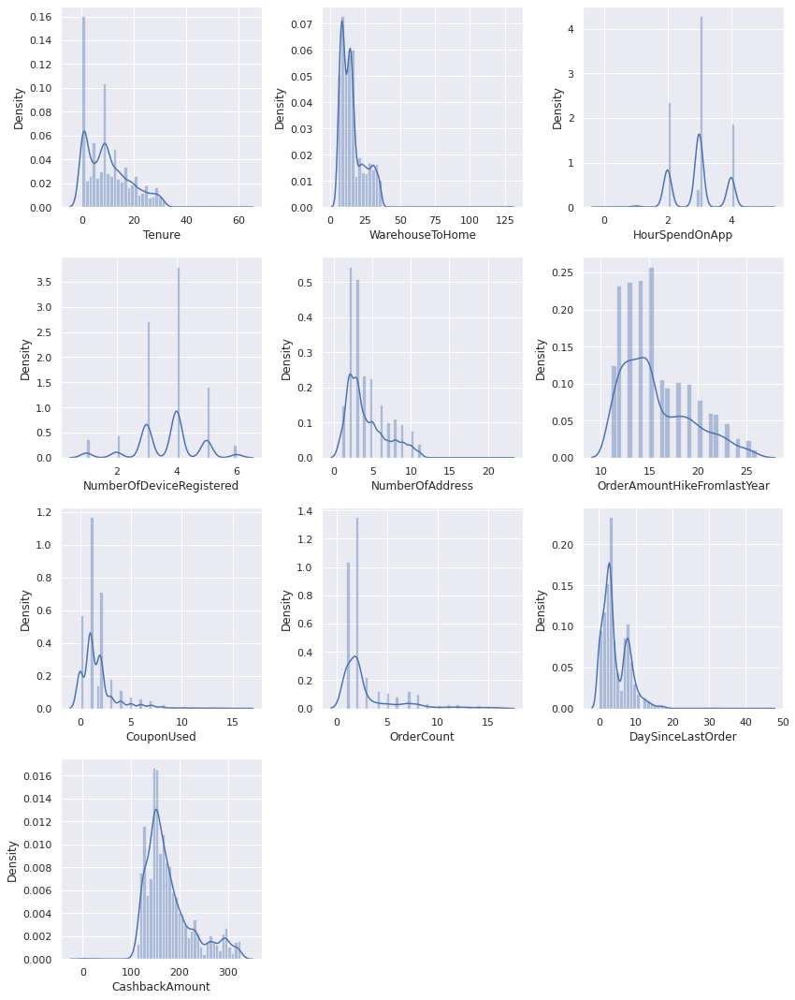

In [122]:
num = nf.columns
fig = plt.subplots(figsize=(12,15))
for i in range(0, len(num)):
    plt.subplot(4, int(len(num)/3), i+1)
    sns.distplot(nf[num[i]])
plt.tight_layout()
plt.show()

<p align = 'justify'>
<i>Normal distribution</i> is a very important distribution in Statistics, but usually the features in the real-life data are not normally distributed.

<ul>Transformations present in scikit-learn:
    <li>Function Transformation</li>
    <ul><i>Log Transformation</i>
        <li>Mostly applied to right-skewed data</li>
        <li>Make data close to a normal distribution but not able to exactly abide by a normal distribution</li>
        <li>Convert data from additive scale to multiplicative scale</li>
        <li>Not applied to those feature which have negative</li>
    </ul>
    <ul><i>Reciprocal Transformation</i>
        <li>Not defined for zero</li>
        <li>Radical effect</li>
        <li>Reverses the order among values of the same sign</li>
    </ul>
    <ul><i>Square and Squareroot Transformation</i>
        <li>Left-skewed data (Square Transformation</li>
        <li>Defined only for positive number</li>
        <li>Can be used for reducing the skewness of right-skewed data</li>
    </ul>
<li>Power Transformation</li>
    <ul>
        <li>Output is more 'Gaussian' like</li>
        <li>Box-cox and Yeo-johnson transforms</li>
        <li>Box-cox requires the input data to be strictly positive (not even zero is acceptable)</li>
        <li>Yeo-johnson accep zero and negatives
<li>Quantile Transformation</li>


Reference : <a href='https://www.analyticsvidhya.com/blog/2021/05/feature-transformations-in-data-science-a-detailed-walkthrough/'>Feature Transformation in Data Science</a>

<h3> Power Transform </h3>

In [123]:
powt = nf

In [124]:
from sklearn.preprocessing import PowerTransformer

#create the power transformer object
pt = PowerTransformer()

#fit and transform
df_transformed = pt.fit_transform(powt)

#dataframe of transformed data
df_transformed_df = pd.DataFrame(df_transformed, 
                                 columns=nf.columns)

print('Original Data: \n', nf)
print('Transformed Data: \n', df_transformed_df)

Original Data: 
       Tenure  WarehouseToHome  HourSpendOnApp  NumberOfDeviceRegistered  \
0        4.0              6.0        3.000000                       3.0   
1        9.0              8.0        3.000000                       4.0   
2        9.0             30.0        2.000000                       4.0   
3        0.0             15.0        2.000000                       4.0   
4        0.0             12.0        2.931535                       3.0   
...      ...              ...             ...                       ...   
5625    10.0             30.0        3.000000                       2.0   
5626    13.0             13.0        3.000000                       5.0   
5627     1.0             11.0        3.000000                       2.0   
5628    23.0              9.0        4.000000                       5.0   
5629     8.0             15.0        3.000000                       2.0   

      NumberOfAddress  OrderAmountHikeFromlastYear  CouponUsed  OrderCount  \
0   

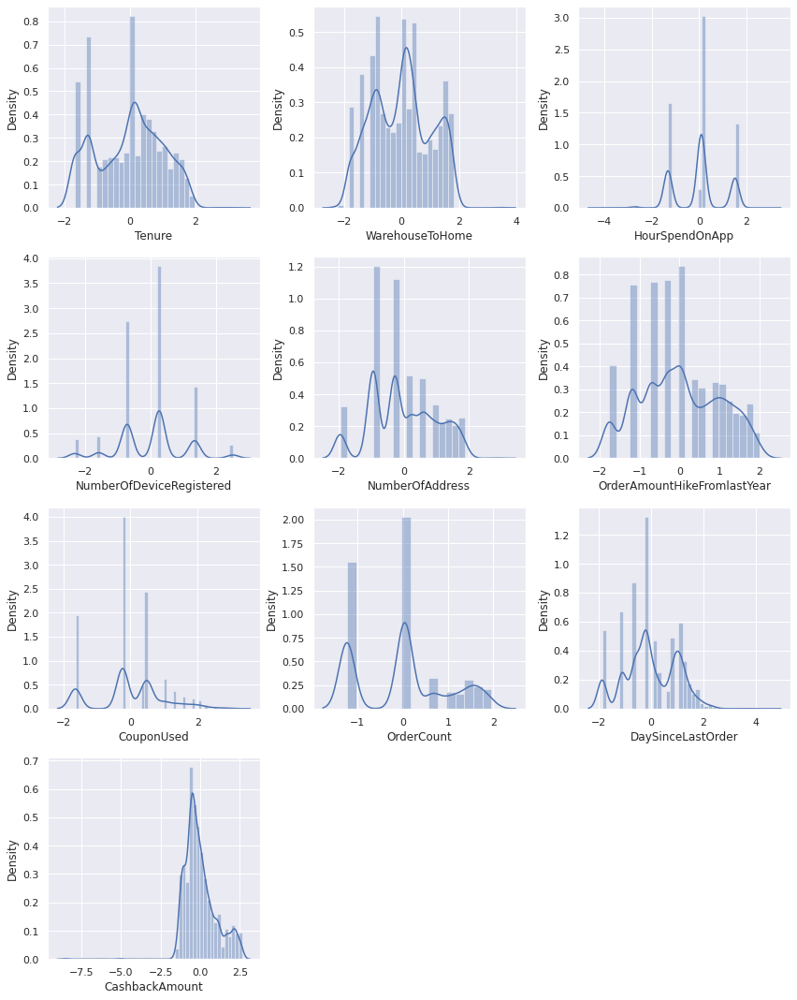

In [125]:
tf = df_transformed_df.columns
fig = plt.subplots(figsize=(12,15))
for i in range(0, len(tf)):
    plt.subplot(4, int(len(tf)/3), i+1)
    sns.distplot(df_transformed_df[tf[i]])
plt.tight_layout()
plt.show()

<AxesSubplot:>

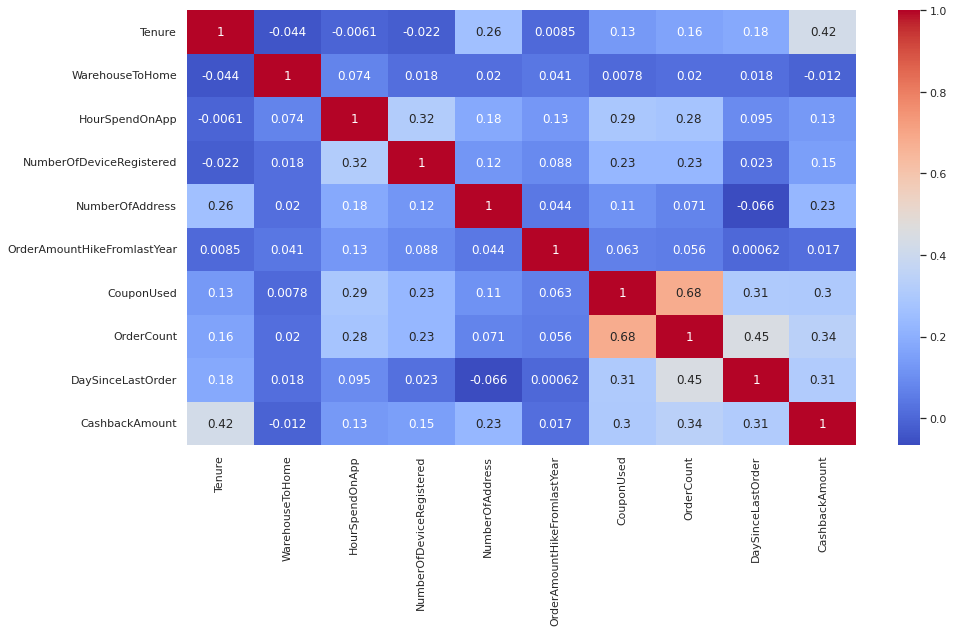

In [126]:
plt.figure(figsize=(15,8))
corr = df_transformed_df.corr()
sns.heatmap(corr, annot=True,
            cmap='coolwarm')

<h3>Log Transformation</h3>

In [127]:
df_log = np.log(nf)
print(df_log)

        Tenure  WarehouseToHome  HourSpendOnApp  NumberOfDeviceRegistered  \
0     1.386294         1.791759        1.098612                  1.098612   
1     2.197225         2.079442        1.098612                  1.386294   
2     2.197225         3.401197        0.693147                  1.386294   
3         -inf         2.708050        0.693147                  1.386294   
4         -inf         2.484907        1.075526                  1.098612   
...        ...              ...             ...                       ...   
5625  2.302585         3.401197        1.098612                  0.693147   
5626  2.564949         2.564949        1.098612                  1.609438   
5627  0.000000         2.397895        1.098612                  0.693147   
5628  3.135494         2.197225        1.386294                  1.609438   
5629  2.079442         2.708050        1.098612                  0.693147   

      NumberOfAddress  OrderAmountHikeFromlastYear  CouponUsed  OrderCount 

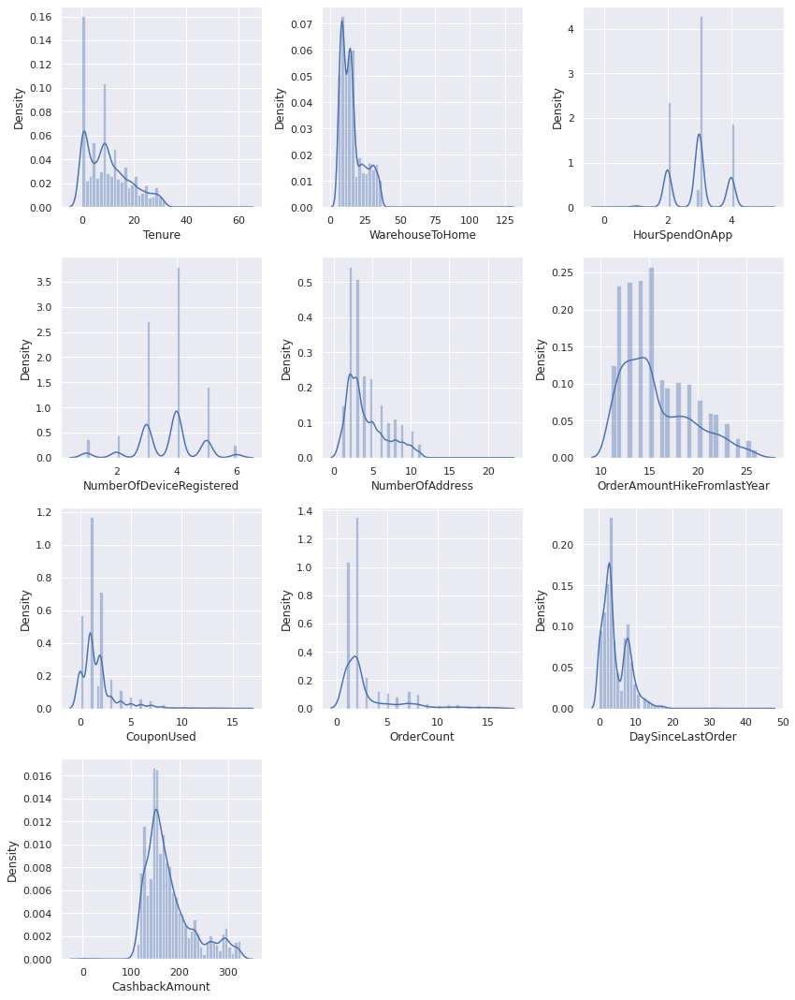

In [128]:
logf = df_log.columns
fig = plt.subplots(figsize=(12,15))
for i in range(0, len(num)):
    plt.subplot(4, int(len(num)/3), i+1)
    sns.distplot(df[logf[i]])
plt.tight_layout()
plt.show()

<AxesSubplot:>

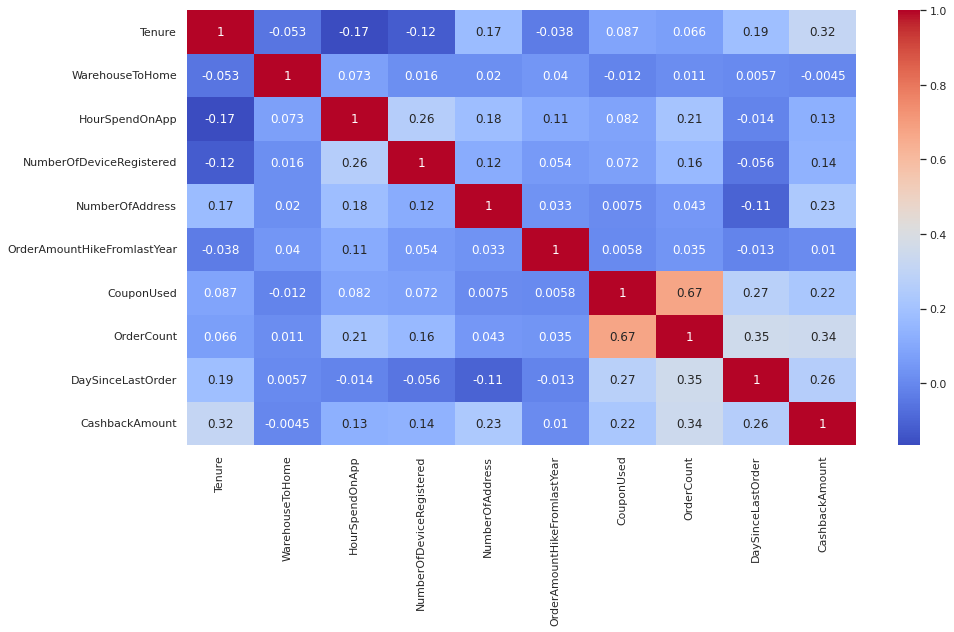

In [129]:
plt.figure(figsize=(15,8))
corr = df_log.corr()
sns.heatmap(corr, annot=True,
            cmap='coolwarm')

<h3>Square Root</h3>

In [130]:
df_sqrt= np.sqrt(nf)
print(df_sqrt)

        Tenure  WarehouseToHome  HourSpendOnApp  NumberOfDeviceRegistered  \
0     2.000000         2.449490        1.732051                  1.732051   
1     3.000000         2.828427        1.732051                  2.000000   
2     3.000000         5.477226        1.414214                  2.000000   
3     0.000000         3.872983        1.414214                  2.000000   
4     0.000000         3.464102        1.712173                  1.732051   
...        ...              ...             ...                       ...   
5625  3.162278         5.477226        1.732051                  1.414214   
5626  3.605551         3.605551        1.732051                  2.236068   
5627  1.000000         3.316625        1.732051                  1.414214   
5628  4.795832         3.000000        2.000000                  2.236068   
5629  2.828427         3.872983        1.732051                  1.414214   

      NumberOfAddress  OrderAmountHikeFromlastYear  CouponUsed  OrderCount 

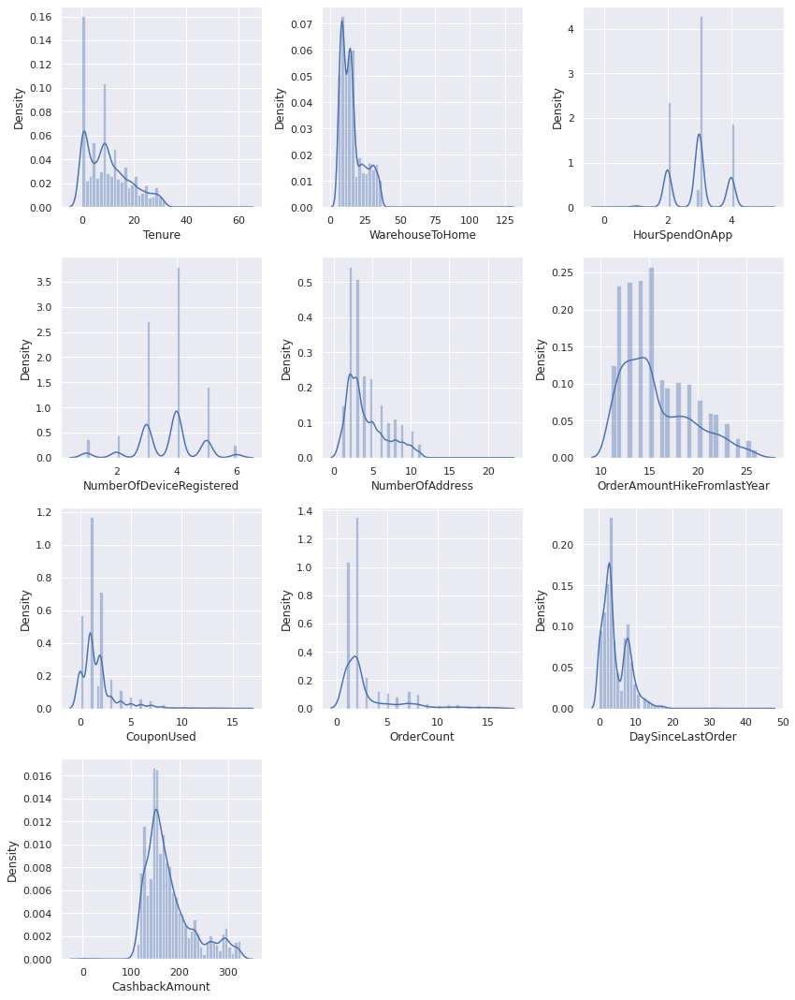

In [131]:
sqrttf = df_sqrt.columns
fig = plt.subplots(figsize=(12,15))
for i in range(0, len(num)):
    plt.subplot(4, int(len(num)/3), i+1)
    sns.distplot(df[sqrttf[i]])
plt.tight_layout()
plt.show()

<AxesSubplot:>

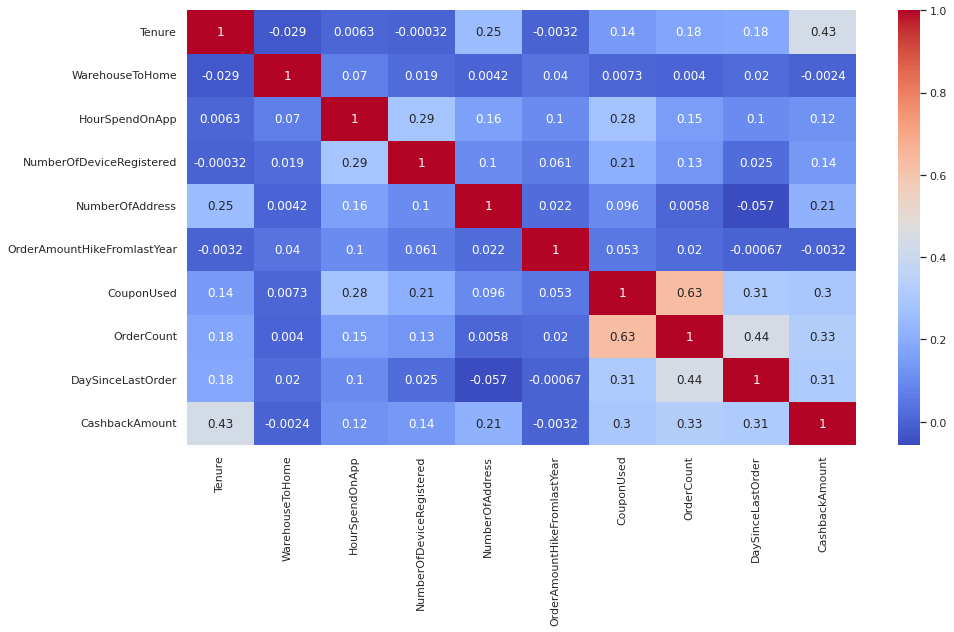

In [132]:
plt.figure(figsize=(15,8))
corr = df_sqrt.corr()
sns.heatmap(corr, annot=True,
            cmap='coolwarm')

<h3>Skewness and Kurtoses</h3>

#Measures of Skewness and Kurtosis in Python<br>
As rule of thumb, skewness can be interpreted like this: 
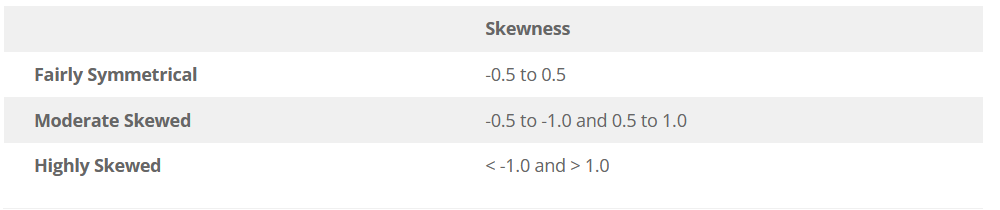


source : https://www.marsja.se/transform-skewed-data-using-square-root-log-box-cox-methods-in-python/

The measure of Kurtosis refers to the tailedness of a distribution. Tailedness refres how often the outliers occur. Excess kurtosis irelative to a normal distribution.<br>
Peakedness in a data distribution is the degree to which data values are concentrated around the mean. Datasets with high kurtosis tend to have a distinct peak near the mean, decline rapidly, and have heavy tails. Datasets with low kurtosis tend to have a flat top near the mean rather than a sharp peak.<br>
A large kurtosis indicates that there are high probabilities, on the other hand, a small kurtosis signals that the probabilities low.<br>
source : https://www.analyticsvidhya.com/blog/2021/05/shape-of-data-skewness-and-kurtosis/#What_Is_Skewness?

In [133]:
#Measure skewed before features being transformed
skewkurtosis_before = nf.agg(['skew', 'kurtosis']).transpose()
print(skewkurtosis_before)

                                 skew   kurtosis
Tenure                       0.773278   0.154613
WarehouseToHome              1.678346  10.606302
HourSpendOnApp              -0.027850  -0.556346
NumberOfDeviceRegistered    -0.396969   0.582849
NumberOfAddress              1.088639   0.959229
OrderAmountHikeFromlastYear  0.835439  -0.125375
CouponUsed                   2.605547   9.709842
OrderCount                   2.276640   5.147816
DaySinceLastOrder            1.273530   4.405103
CashbackAmount               1.149846   0.974505


Based on our measurement above, we know that: <br>
- Features that has Fairly symmetrical are CustomerID, HoursSpendOnApp,NumberOfDeviceRegistered<br>
- Features that has Moderate skewed are WarehouseHome, HourSpendOnApp, NumberOfDeviceRegsitered, SatisfactionScore, DaysSinceLastOrder,CashbackAmount,Complain, OrderAmountHikeFromLastYear,Tenure,CitiTier<br>
- Features that has Highly skewed are Churn, NumberOfAddress,CouponUsed,OrderCount

In [134]:
#Measure skewed after features being transformed with power transform
measure_pow= df_transformed_df.agg(['skew', 'kurtosis']).transpose()
print(measure_pow)

                                 skew  kurtosis
Tenure                      -0.132599 -0.966195
WarehouseToHome              0.047854 -0.943150
HourSpendOnApp              -0.029347 -0.554864
NumberOfDeviceRegistered     0.015066  0.284061
NumberOfAddress              0.028398 -0.732866
OrderAmountHikeFromlastYear  0.082174 -0.919048
CouponUsed                   0.002656 -0.119687
OrderCount                   0.224301 -0.977704
DaySinceLastOrder           -0.032944 -0.577978
CashbackAmount               0.264961  4.234709


In [135]:
#Measure skewed after features being log transformed
Measure_log= df_log.agg(['skew', 'kurtosis']).transpose()
print(Measure_log)

                                 skew  kurtosis
Tenure                            NaN       NaN
WarehouseToHome              0.238748 -0.819931
HourSpendOnApp                    NaN       NaN
NumberOfDeviceRegistered    -1.829466  4.397483
NumberOfAddress             -0.052713 -0.596081
OrderAmountHikeFromlastYear  0.471376 -0.682048
CouponUsed                        NaN       NaN
OrderCount                   0.845751 -0.041419
DaySinceLastOrder                 NaN       NaN
CashbackAmount                    NaN       NaN


In [136]:
#Measure skewed after features being squareroot transformed
Measure_sqrt= df_sqrt.agg(['skew', 'kurtosis']).transpose()
print(Measure_sqrt)

                                 skew  kurtosis
Tenure                      -0.217301 -0.752551
WarehouseToHome              0.718383  0.396101
HourSpendOnApp              -0.513054  1.568102
NumberOfDeviceRegistered    -1.058352  1.889047
NumberOfAddress              0.539377 -0.448600
OrderAmountHikeFromlastYear  0.651888 -0.448123
CouponUsed                   0.229209  0.697077
OrderCount                   1.548127  1.862038
DaySinceLastOrder           -0.170560 -0.092171
CashbackAmount               0.526796  2.611582


After being transformed, skew got  nearer to normal distribution

<h2>Feature Encoding</h2>

<p align = 'justify'>
Mengubah feature Catergorical menjadi Numerical
    
<li>Teknik Label Encoding, digunakan jika feature dengan variabel yang memiliki urutan/peringkat.</li>
<li>Teknik One-Hot-Encoding, digunakan jika feature dengan variabel hanyalah nama dan tidak ada urutan atau peringkat pada feature variabel ini.</li>

<a href='https://medium.com/nerd-for-tech/nominal-and-ordinal-encoding-in-data-science-c93872601f16'>Referensi aturan Feature Encoding</a>

<h3>PreferredLoginDevice</h3>

In [137]:
df_PreferredLoginDevice=pd.get_dummies(df['PreferredLoginDevice'], prefix='PreferredLoginDevice')
df_PreferredLoginDevice.head(4)

,PreferredLoginDevice_Computer,PreferredLoginDevice_Mobile Phone
0,0,1
1,0,1
2,0,1
3,0,1


<h3>PreferredPaymentMode</h3>

In [138]:
df_PreferredPaymentMode=pd.get_dummies(df['PreferredPaymentMode'], prefix='PreferredPaymentMode')
df_PreferredPaymentMode.head(4)

,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI
0,0,0,1,0,0
1,0,0,0,0,1
2,0,0,1,0,0
3,0,0,1,0,0


<h3>Gender</h3>

In [139]:
mapping_gender={
    'Male':0,
    'Female':1
}
df_gender=df['Gender'].map(mapping_gender)
df_gender.head(4)

0    1
1    0
2    0
3    0
Name: Gender, dtype: int64

<h3>PreferedOrderCat</h3>

In [140]:
df_POC=pd.get_dummies(df['PreferedOrderCat'], prefix='Prefered Order Category')
df_POC.head(5)

,Prefered Order Category_Fashion,Prefered Order Category_Grocery,Prefered Order Category_Laptop & Accessory,Prefered Order Category_Mobile Phone,Prefered Order Category_Others
0,0,0,1,0,0
1,0,0,0,1,0
2,0,0,0,1,0
3,0,0,1,0,0
4,0,0,0,1,0


<h3>MaritalStatus</h3>

In [141]:
df_MS=pd.get_dummies(df['MaritalStatus'],prefix='Marital Status')
df_MS.head(5)

,Marital Status_Divorced,Marital Status_Married,Marital Status_Single
0,0,0,1
1,0,0,1
2,0,0,1
3,0,0,1
4,0,0,1


<h3>Merge Encoding</h3>

In [142]:
#MERGE COLUMN ENCODING
df_PreferredLoginDevice = df_PreferredLoginDevice.reset_index(drop=True)
df_PreferredPaymentMode = df_PreferredPaymentMode.reset_index(drop=True)
df_gender = df_gender.reset_index(drop=True)
#preferedordercat
#Maritalstatus

merged_encoding = pd.concat([df_PreferredLoginDevice, df_PreferredPaymentMode,df_gender], axis=1)
merged_encoding.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 8 columns):
 #   Column                                 Non-Null Count  Dtype
---  ------                                 --------------  -----
 0   PreferredLoginDevice_Computer          5630 non-null   uint8
 1   PreferredLoginDevice_Mobile Phone      5630 non-null   uint8
 2   PreferredPaymentMode_Cash on Delivery  5630 non-null   uint8
 3   PreferredPaymentMode_Credit Card       5630 non-null   uint8
 4   PreferredPaymentMode_Debit Card        5630 non-null   uint8
 5   PreferredPaymentMode_E wallet          5630 non-null   uint8
 6   PreferredPaymentMode_UPI               5630 non-null   uint8
 7   Gender                                 5630 non-null   int64
dtypes: int64(1), uint8(7)
memory usage: 82.6 KB


In [143]:
merged_encoding.sample(4)

,PreferredLoginDevice_Computer,PreferredLoginDevice_Mobile Phone,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender
2315,0,1,0,1,0,0,0,1
2172,1,0,0,0,1,0,0,0
1302,0,1,0,0,1,0,0,0
5072,0,1,0,0,1,0,0,0


<h2>Merge Feature</h2>

<h3>df with encoding</h3>

In [144]:
df = df.drop(['level_0','index',
             'PreferredLoginDevice',
             'PreferredPaymentMode',
             'Gender',
             'PreferedOrderCat',
             'MaritalStatus'],axis=1)

In [145]:
rf_feature = pd.concat([df,merged_encoding],axis=1)
rf_feature.head(2)

,CustomerID,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,...,DaySinceLastOrder,CashbackAmount,PreferredLoginDevice_Computer,PreferredLoginDevice_Mobile Phone,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender
0,50001.0,1.0,4.0,3.0,6.0,3.0,3.0,2.0,9.0,1.0,...,5.0,159.93,0,1,0,0,1,0,0,1
1,50002.0,1.0,9.0,1.0,8.0,3.0,4.0,3.0,7.0,1.0,...,0.0,120.90,0,1,0,0,0,0,1,0


<h3>transformation and encoding</h3>

In [146]:
df2 = df[['CustomerID','Churn','CityTier','SatisfactionScore','Complain']]
df2.head(2)

,CustomerID,Churn,CityTier,SatisfactionScore,Complain
0,50001.0,1.0,3.0,2.0,1.0
1,50002.0,1.0,1.0,3.0,1.0


In [147]:
features = pd.concat([df2,df_transformed_df,merged_encoding],axis=1)
features.head(2)

,CustomerID,Churn,CityTier,SatisfactionScore,Complain,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,NumberOfAddress,...,DaySinceLastOrder,CashbackAmount,PreferredLoginDevice_Computer,PreferredLoginDevice_Mobile Phone,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender
0,50001.0,1.0,3.0,2.0,1.0,-0.582398,-1.761459,0.097388,-0.721612,1.553861,...,0.395489,-0.292848,0,1,0,0,1,0,0,1
1,50002.0,1.0,1.0,3.0,1.0,0.132848,-1.095000,0.097388,0.260014,1.143982,...,-1.866945,-1.246617,0,1,0,0,0,0,1,0


<h2> Data Splitting </h2>

In [148]:
#make dataset for splitting
X = features.drop(['Churn'],axis=1)
y = features[['Churn','CustomerID']]

In [149]:
#splitting the data into Train and Test
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=42)

In [150]:
print('dataset shape :',df.shape)
print('X train :',Xtrain.shape)
print('X test :',Xtest.shape)
print('y train :',ytrain.shape)
print('y test :',ytest.shape)

dataset shape : (5630, 15)
X train : (3941, 22)
X test : (1689, 22)
y train : (3941, 2)
y test : (1689, 2)


In [151]:
ytest = ytest.drop(['CustomerID'],axis=1)

In [152]:
train = pd.merge(Xtrain, ytrain, on='CustomerID')
train.sample(2)

,CustomerID,CityTier,SatisfactionScore,Complain,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,NumberOfAddress,OrderAmountHikeFromlastYear,...,CashbackAmount,PreferredLoginDevice_Computer,PreferredLoginDevice_Mobile Phone,PreferredPaymentMode_Cash on Delivery,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_UPI,Gender,Churn
2613,53846.0,1.0,3.0,0.0,0.550600,-0.600448,1.514418,1.343815,-0.940365,0.328901,...,-0.388920,0,1,0,1,0,0,0,0,0.0
1904,51661.0,1.0,1.0,0.0,0.815935,0.103416,-1.320929,-0.721612,-1.955023,1.032697,...,-1.149981,1,0,0,0,1,0,0,1,0.0


## Handling Outliers

### DaySinceLastOrder

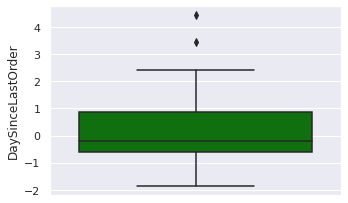

In [153]:
fig = plt.subplots(figsize=(5,3))
sns.boxplot(y=train['DaySinceLastOrder'],color='green', orient='v')
plt.tight_layout()
plt.show()

Dari visualisasi di atas dapat dilihat hanya ada sebagian kecil nilai yang jauh dari distribusi sehingga menjadi nilai pencilan. Tindakan yang akan saya lakukan adalah mengganti nilainya dengan nilai median yang robust terhadap pencilan.

In [154]:
train['DaySinceLastOrder'] = train['DaySinceLastOrder'].mask(train['DaySinceLastOrder']>2.5, train['DaySinceLastOrder'].median())

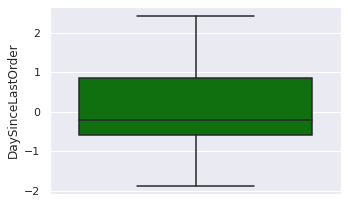

In [155]:
fig = plt.subplots(figsize=(5,3))
sns.boxplot(y=train['DaySinceLastOrder'],color='green', orient='v')
plt.tight_layout()
plt.show()

DaySinceLastOrder bebas dari pencilan.

### HourSpendOnApp

<AxesSubplot:xlabel='HourSpendOnApp'>

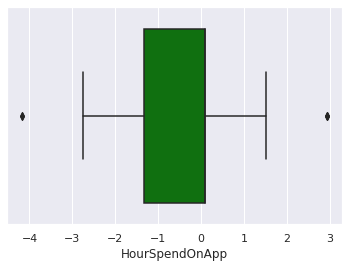

In [156]:
sns.boxplot(train['HourSpendOnApp'],color='green', orient='v')

Ada beberapa nilai di luar IQR sehingga menjadi outliers. Selanjutnya saya akan mentransformasikan nilai-nilai tersebut menjadi nilai "upper_limit" dan "lower_limit"

In [157]:
percentile25_hsoa = train['HourSpendOnApp'].quantile(0.25)
percentile75_hsoa = train['HourSpendOnApp'].quantile(0.75)
iqr_hsoa = percentile75_hsoa - percentile25_hsoa
iqr_hsoa

1.4183173098551802

In [158]:
upper_limit_hsoa = percentile75_hsoa + 1.5 * iqr_hsoa
lower_limit_hsoa = percentile25_hsoa - 1.5 * iqr_hsoa
print("Upper limit",upper_limit_hsoa)
print("Lower limit",lower_limit_hsoa)

Upper limit 2.2248641745711293
Lower limit -3.4484050648495925


In [159]:
train['HourSpendOnApp'] = train['HourSpendOnApp'].mask(train['HourSpendOnApp']>upper_limit_hsoa, upper_limit_hsoa)
train['HourSpendOnApp'] = train['HourSpendOnApp'].mask(train['HourSpendOnApp']<lower_limit_hsoa, lower_limit_hsoa)

<AxesSubplot:xlabel='HourSpendOnApp'>

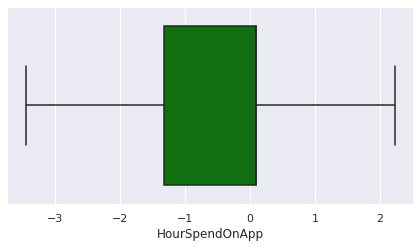

In [160]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.boxplot(train['HourSpendOnApp'],color='green', orient='v')

HourSpendOnApp bebas dari pencilan.

### CouponUsed

<AxesSubplot:xlabel='CouponUsed'>

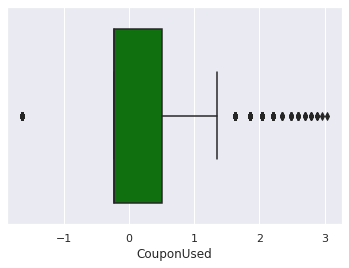

In [161]:
sns.boxplot(train['CouponUsed'],color='green', orient='v')

Ada beberapa nilai di luar IQR sehingga menjadi outliers. Selanjutnya saya akan mentransformasikan nilai-nilai tersebut menjadi nilai "upper_limit" dan "lower_limit"

In [162]:
percentile25 = train['CouponUsed'].quantile(0.25)
percentile75 = train['CouponUsed'].quantile(0.75)
iqr = percentile75 - percentile25
iqr

0.7341563245994712

In [163]:
upper_limit_cu = percentile75 + 1.5 * iqr
lower_limit_cu = percentile25 - 1.5 * iqr
print("Upper limit",upper_limit_cu)
print("Lower limit",lower_limit_cu)

Upper limit 1.6041179074695588
Lower limit -1.332507390928326


In [164]:
train['CouponUsed'] = train['CouponUsed'].mask(train['CouponUsed']>upper_limit_cu, upper_limit_cu)
train['CouponUsed'] = train['CouponUsed'].mask(train['CouponUsed']<lower_limit_cu, lower_limit_cu)

<AxesSubplot:xlabel='CouponUsed'>

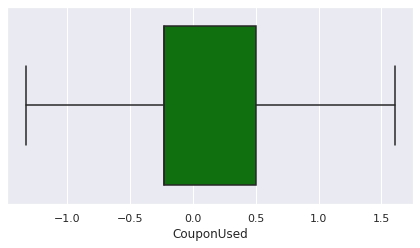

In [165]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.boxplot(train['CouponUsed'],color='green', orient='v')

CouponUsed bebas dari pencilan.

### Tenure

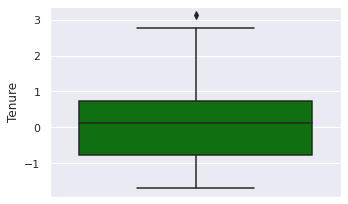

In [166]:
fig = plt.subplots(figsize=(5,3))
sns.boxplot(y=train['Tenure'],color='green', orient='v')
plt.tight_layout()
plt.show()

Data awal Tenure, ada beberapa pencilan dari data tersebut. Tindakan yang dilakukan adalah mengganti nilainya menjadi nilai upper_limit.

In [167]:
percentile25_tenure = train['Tenure'].quantile(0.25)
percentile75_tenure = train['Tenure'].quantile(0.75)
iqr_tenure = percentile75_tenure - percentile25_tenure
iqr_tenure

1.507961310563962

In [168]:
upper_limit_tenure = percentile75_tenure + 1.5 * iqr_tenure
print("Upper limit",upper_limit_tenure)

Upper limit 2.9930089177143673


In [169]:
train['Tenure'] = train['Tenure'].mask(train['Tenure']>upper_limit_tenure, upper_limit_tenure)

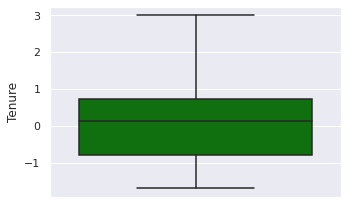

In [170]:
fig = plt.subplots(figsize=(5,3))
sns.boxplot(y=train['Tenure'],color='green', orient='v')
plt.tight_layout()
plt.show()

Setelah dilakukan transformasi, data 'Tenure' bebas dari pencilan.

### WarehouseToHome

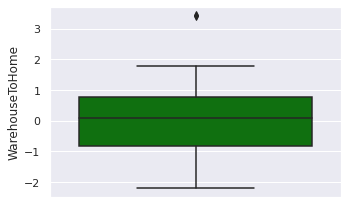

In [171]:
fig = plt.subplots(figsize=(5,3))
sns.boxplot(y=train['WarehouseToHome'],color='green', orient='v')
plt.tight_layout()
plt.show()

Data awal WarehouseToHome, ada beberapa pencilan dari data tersebut. Tindakan yang dilakukan adalah mengganti nilainya menjadi nilai upper_limit.

In [172]:
percentile25_whth = train['WarehouseToHome'].quantile(0.25)
percentile75_whth = train['WarehouseToHome'].quantile(0.75)
iqr_whth = percentile75_whth - percentile25_whth
iqr_whth

1.622481059828329

In [173]:
upper_limit_whth = percentile75_whth + 1.5 * iqr_whth
print("Upper limit",upper_limit_whth)

Upper limit 3.224867961596477


In [174]:
train['WarehouseToHome'] = train['WarehouseToHome'].mask(train['WarehouseToHome']>upper_limit_whth, upper_limit_whth)

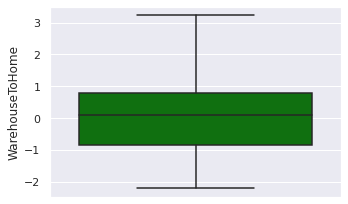

In [175]:
fig = plt.subplots(figsize=(5,3))
sns.boxplot(y=train['WarehouseToHome'],color='green', orient='v')
plt.tight_layout()
plt.show()

Setelah dilakukan transformasi sedemikian rupa, data WarehouseToHome bebas dari nilai pencilan.

### NumberOfDeviceRegistered

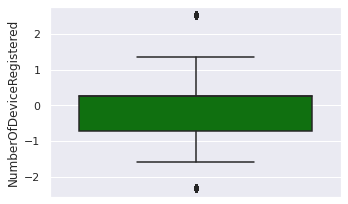

In [176]:
fig = plt.subplots(figsize=(5,3))
sns.boxplot(y=train['NumberOfDeviceRegistered'],color='green', orient='v')
plt.tight_layout()
plt.show()

Ada beberapa nilai di luar IQR sehingga menjadi outliers. Selanjutnya saya akan mentransformasikan nilai-nilai tersebut menjadi nilai "upper_limit" dan "lower_limit"

In [177]:
percentile25_nodr = train['NumberOfDeviceRegistered'].quantile(0.25)
percentile75_nodr = train['NumberOfDeviceRegistered'].quantile(0.75)
iqr_nodr = percentile75_nodr - percentile25_nodr
iqr_nodr

0.9816260488837503

In [178]:
upper_limit_nodr = percentile75_nodr + 1.5 * iqr_nodr
lower_limit_nodr = percentile25_nodr - 1.5 * iqr_nodr
print("Upper limit",upper_limit_nodr)
print("Lower limit",lower_limit_nodr)

Upper limit 1.7324529108834243
Lower limit -2.194051284651577


In [179]:
train['NumberOfDeviceRegistered'] = train['NumberOfDeviceRegistered'].mask(train['NumberOfDeviceRegistered']>upper_limit_nodr, upper_limit_nodr)
train['NumberOfDeviceRegistered'] = train['NumberOfDeviceRegistered'].mask(train['NumberOfDeviceRegistered']<lower_limit_nodr, lower_limit_nodr)

<AxesSubplot:xlabel='NumberOfDeviceRegistered'>

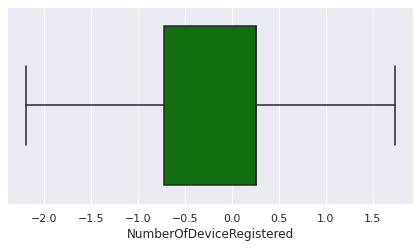

In [180]:
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sns.boxplot(train['NumberOfDeviceRegistered'],color='green', orient='v')

NumberOfDeviceRegistered bebas dari pencilan.

### CashbackAmount

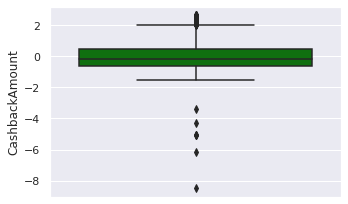

In [181]:
fig = plt.subplots(figsize=(5,3))
sns.boxplot(y=train['CashbackAmount'],color='green', orient='v')
plt.tight_layout()
plt.show()

Ada beberapa nilai di luar IQR sehingga menjadi outliers. Selanjutnya saya akan mentransformasikan nilai-nilai tersebut menjadi nilai "upper_limit" dan "lower_limit"

In [182]:
percentile25_ca = train['CashbackAmount'].quantile(0.25)
percentile75_ca = train['CashbackAmount'].quantile(0.75)
iqr_ca = percentile75_ca - percentile25_ca
iqr_ca

1.062485359855317

In [183]:
upper_limit_ca = percentile75_ca + 1.5 * iqr_ca
lower_limit_ca = percentile25_ca - 1.5 * iqr_ca
print("Upper limit",upper_limit_ca)
print("Lower limit",lower_limit_ca)

Upper limit 2.033382157632583
Lower limit -2.2165592817886854


In [184]:
train['CashbackAmount'] = train['CashbackAmount'].mask(train['CashbackAmount']>upper_limit_ca, upper_limit_ca)
train['CashbackAmount'] = train['CashbackAmount'].mask(train['CashbackAmount']<lower_limit_ca, lower_limit_ca)

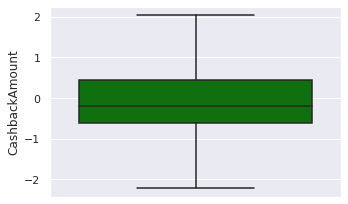

In [185]:
fig = plt.subplots(figsize=(5,3))
sns.boxplot(y=train['CashbackAmount'],color='green', orient='v')
plt.tight_layout()
plt.show()

CashbackAmount bebas dari pencilan.

<h3> drop column </h3>

In [186]:
X = X.drop(['CustomerID'],axis=1)
ytrain = train['Churn']
Xtrain = train.drop(['CustomerID','Churn'], axis=1)
Xtest = Xtest.drop(['CustomerID'], axis=1)

In [187]:
print('X train :',Xtrain.shape)
print('X test :',Xtest.shape)
print('y train :',ytrain.shape)
print('y test :',ytest.shape)

X train : (3941, 21)
X test : (1689, 21)
y train : (3941,)
y test : (1689, 1)


In [188]:
y = y.drop(['CustomerID'],axis=1)

<h3>Oversampling On Data Spliting </h3>

In [189]:
from imblearn.over_sampling import SMOTE

# apply SMOTE to the training data only
smote = SMOTE()
X_train_oversampled, y_train_oversampled = smote.fit_resample(Xtrain, ytrain)

In [190]:
print("Jumlah data sebelum oversampling:", len(ytrain))
print("Jumlah data setelah oversampling:", len(y_train_oversampled))
print("Jumlah data kelas 0 setelah oversampling:", sum(y_train_oversampled == 0))
print("Jumlah data kelas 1 setelah oversampling:", sum(y_train_oversampled == 1))

Jumlah data sebelum oversampling: 3941
Jumlah data setelah oversampling: 6536
Jumlah data kelas 0 setelah oversampling: 3268
Jumlah data kelas 1 setelah oversampling: 3268


<hr>
note : Oversampling pada data testing tidak perlu dilakukan, karena tujuan dari oversampling adalah untuk menyeimbangkan jumlah data di setiap kelas pada data training. Data testing harus mencerminkan kondisi dunia nyata dan seharusnya tidak dimanipulasi seperti data training.

<h1> <b>Machine Learning Model</b></h1>

<ul><b>Machine Learning Model</b>
    <li>DecisionTree</li>
    Reference: <a href='https://www.kaggle.com/code/prashant111/decision-tree-classifier-tutorial'>Decision-Tree Classifier Tutorial</a>, 
    <a href='https://www.kaggle.com/code/dmilla/introduction-to-decision-trees-titanic-dataset'>Introduction to Decision Trees</a>, 
    <a href='https://towardsdatascience.com/understanding-decision-tree-classification-with-scikit-learn-2ddf272731bd'>Decision Tree and Gini Impurity</a>, 
    <a href='https://medium.com/codex/building-and-visualizing-decision-tree-in-python-2cfaafd8e1bb'>Building and Visualizing Decision Tree in Python</a>,
    <a href='https://medium.com/mlearning-ai/breast-cancer-detection-with-decision-trees-f66637ac482e'>Decision Tree with Python Scikit-Learn</a>
    <li>RandomForest</li>
    Reference: <a href='https://www.kaggle.com/code/prashant111/random-forest-classifier-tutorial'>Random Forest Classifier Tutorial</a>,
    <a href='https://www.kaggle.com/code/prashant111/random-forest-classifier-feature-importance'>Random Forest Classifier + Feature Importance</a>,
    <a href='https://medium.com/p/24d0893d51c0'>Random Forest in Python</a>,
    <a href='https://medium.com/p/28d2aa77dd74'>Hyperparameter Tuning the Random Forest in Python</a>
    <li>GradientBoostingMachines(GBM)</li>
    <li>SupportVectorMachines(SVM)</li>
    <li>LogisticRegression</li>

<ul><b>Random Forest Asumption</b>
    <li>Independence of observations: The observations in the data set should be independent of each other. That is, the values of one observation should not be influenced by the values of another observation.</li>
    <li>No multicollinearity: If the data includes multiple variables, they should not be highly correlated with each other. Multicollinearity can lead to unstable and unreliable estimates of the feature importance.</li>
    <li>No missing values: The data set should not have any missing values. If there are missing values, they must be imputed or removed before using the random forest model.</li>
    <li>Balanced class distribution: The classes in the data set should be roughly balanced. If one class is much more prevalent than the others, it can lead to biased estimates of the feature importance and prediction accuracy.</li>
    <li>No outliers: The data set should not have any extreme outliers. Outliers can have a disproportionate influence on the model and may lead to overfitting.</li>
</ul>
<i>Random forests are generally robust to violations of these assumptions and can still produce good results in many cases.</i>

Support Vector Machines (SVM) -> need ohe<br>
Random Forests<br>
Gradient Boosting Machines (GBM)<br>
Extreme Gradient Boosting (XGBoost)<br>
AdaBoost

<ul><b>Logistic Regression</b>
    <li>Binary logistic regression requires the dependent variable to be binary.</li>
    <li>For a binary regression, the factor level 1 of the dependent variable should represent the desired outcome.</li>
    <li>Only the meaningful variables should be included</li>
    <li>The independent variables should be independent of each other. That is, the model should have little or no multicollinearity.</li>
    <li>The independent variables are linearly related to the log odds</li>
    <li>Logistic regression requires quite large sample sizes</li>
</ul>
References: <a href = 'https://towardsdatascience.com/building-a-logistic-regression-in-python-step-by-step-becd4d56c9c8'>Building A Logistic Regression in Python</a>

<h3>Random Forest Model</h3>

<h4>Train Model</h4>

In [191]:
X1_train = Xtrain.copy()
X1_test = Xtest.copy()
y1_train = ytrain.copy()
y1_test = ytest.copy()

In [192]:
print('X :',X.shape)
print('X train :',X1_train.shape)
print('X test :',X1_test.shape)
print('y train :',y1_train.shape)
print('y test :',y1_test.shape)

X : (5630, 21)
X train : (3941, 21)
X test : (1689, 21)
y train : (3941,)
y test : (1689, 1)


In [193]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators = 100, random_state = 42)
rf.fit(X1_train,y1_train)

RandomForestClassifier(random_state=42)

<h4>Predictions on the Test Set</h4>

In [194]:
#predict on the test data
rf_predict = rf.predict(X1_test)

<h4>Model Evaluation</h4>

In [195]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report
from sklearn.model_selection import cross_validate

In [196]:
rf_y_pred = rf.predict(X1_test)
rf_y_pred_train = rf.predict(X1_train)
rf_y_pred_proba = rf.predict_proba(X1_test)
rf_y_pred_proba_train = rf.predict_proba(X1_train)

In [197]:
print("Accuracy (Test Set): %.2f" % accuracy_score(y1_test, rf_y_pred))
print("Precision (Test Set): %.2f" % precision_score(y1_test, rf_y_pred))
print("Recall (Test Set): %.2f" % recall_score(y1_test, rf_y_pred))
print("F1-Score (Test Set): %.2f" % f1_score(y1_test, rf_y_pred))

Accuracy (Test Set): 0.96
Precision (Test Set): 0.95
Recall (Test Set): 0.81
F1-Score (Test Set): 0.88



terdapat tradeoff antara Precision dan Recall<br>
cara menanggulangi:<br>
ROC AUC atau F1, oversampling(SMOTE), weight class

In [198]:
print(classification_report(y1_test['Churn'], rf_y_pred))

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.98      1414
         1.0       0.95      0.81      0.88       275

    accuracy                           0.96      1689
   macro avg       0.96      0.90      0.93      1689
weighted avg       0.96      0.96      0.96      1689



In [199]:
print("roc_auc (train-proba): %.2f" % roc_auc_score(y1_train, rf_y_pred_proba_train[:, 1]))
print("roc_auc (test-proba): %.2f" % roc_auc_score(y1_test, rf_y_pred_proba[:, 1]))

roc_auc (train-proba): 1.00
roc_auc (test-proba): 0.97


In [200]:
cv_score = cross_validate(rf, X, y, cv=5, scoring='roc_auc', return_train_score=True)

In [201]:
print('roc_auc (crossval train): '+ str(cv_score['train_score'].mean()))
print('roc_auc (crossval test): '+ str(cv_score['test_score'].mean()))

roc_auc (crossval train): 1.0
roc_auc (crossval test): 0.9994775613792072


Text(0.5, 1.0, 'feature importance score')

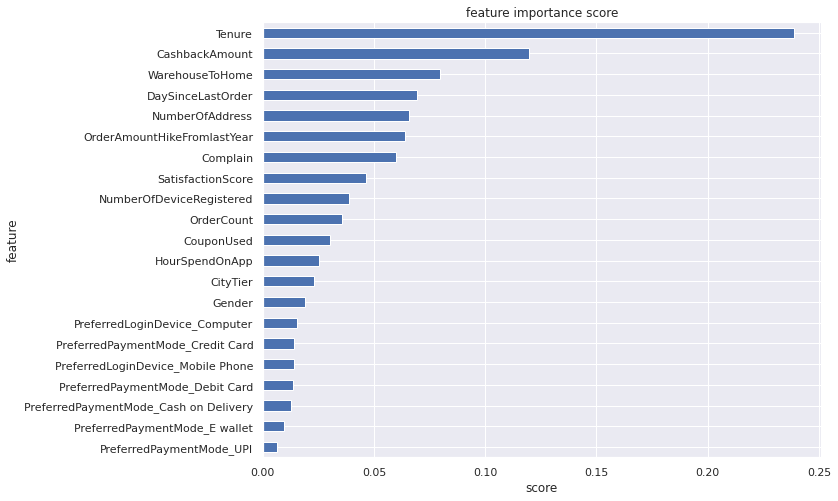

In [202]:
feature_importance = pd.Series(rf.feature_importances_,index=X.columns)
ax = feature_importance.nlargest(25).plot(kind='barh',figsize=(10,8))
ax.invert_yaxis()

plt.xlabel('score')
plt.ylabel('feature')
plt.title('feature importance score')

In [203]:
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold

# Define the recursive feature elimination object with cross-validation
rfe = RFECV(estimator=rf, step=1, cv=StratifiedKFold(5), scoring='roc_auc', verbose=1)

# Fit the RFE object to the data
rfe.fit(X1_train, y1_train)

# Print the selected features
print("Selected features: {}".format(X1_train.columns[rfe.support_]))

Fitting estimator with 21 features.
Fitting estimator with 20 features.
Fitting estimator with 19 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.
Fitting estimator with 3 features.
Fitting estimator with 2 features.
Fitting estimator with 21 features.
Fitting estimator with 20 features.
Fitting estimator with 19 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.


In [204]:
# Get the feature ranking
feature_ranking = rfe.ranking_

# Get the selected feature names
selected_features = X1_train.columns[rfe.support_]

# Combine the feature names and their rankings into a dictionary
feature_dict = dict(zip(selected_features, feature_ranking))

# Sort the features by their rankings in ascending order
sorted_features = sorted(feature_dict.items(), key=lambda x: x[1])

# Print the ranked features
for feature, rank in sorted_features:
    print(f"{feature} (Rank {rank})")

CityTier (Rank 1)
SatisfactionScore (Rank 1)
Complain (Rank 1)
Tenure (Rank 1)
WarehouseToHome (Rank 1)
HourSpendOnApp (Rank 1)
NumberOfDeviceRegistered (Rank 1)
NumberOfAddress (Rank 1)
OrderAmountHikeFromlastYear (Rank 1)
CouponUsed (Rank 1)
OrderCount (Rank 1)
DaySinceLastOrder (Rank 1)
CashbackAmount (Rank 1)
PreferredLoginDevice_Computer (Rank 1)
PreferredLoginDevice_Mobile Phone (Rank 1)
PreferredPaymentMode_Cash on Delivery (Rank 1)
PreferredPaymentMode_Credit Card (Rank 1)
PreferredPaymentMode_Debit Card (Rank 1)
PreferredPaymentMode_E wallet (Rank 1)
PreferredPaymentMode_UPI (Rank 1)
Gender (Rank 1)


              precision    recall  f1-score   support

         0.0       0.96      0.99      0.98      1414
         1.0       0.95      0.81      0.88       275

    accuracy                           0.96      1689
   macro avg       0.96      0.90      0.93      1689
weighted avg       0.96      0.96      0.96      1689



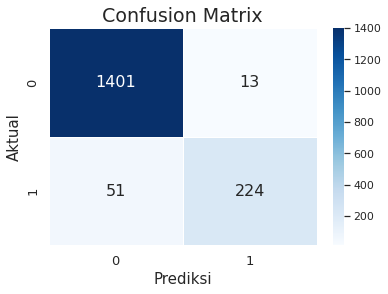

In [205]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

# Confusion Matrix Test
cnf_matrix = confusion_matrix(y1_test, rf_y_pred)
print(classification_report(y1_test, rf_y_pred))
sns.heatmap(cnf_matrix,cmap='Blues',annot=True,linewidth=0.5,fmt='d',annot_kws={"size": 16})
plt.title('Confusion Matrix', fontsize=19)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Prediksi',fontsize=15)
plt.ylabel('Aktual', fontsize=15)
plt.show()

In [206]:
cf = confusion_matrix(y1_test, rf_y_pred)
cf

array([[1401,   13],
       [  51,  224]])

In [207]:
#Expected value
total_cf = np.sum(cf)
expected = cf / total_cf
print("Confusion Matrix with Expected Values:")
for i in range(expected.shape[0]):
    for j in range(expected.shape[1]):
        print("{:.2f}".format(expected[i, j]), end='\t')
    print()

Confusion Matrix with Expected Values:
0.83	0.01	
0.03	0.13	


In [208]:
prob = np.array([[0.13,0.03],[0.01,0.83]])
cnb = np.array([[0,0],[-150,850]])
exp_prof = sum(sum(np.dot(prob,cnb)))
exp_prof

602.0

In [209]:
from pprint import pprint

In [210]:
print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


<h3>Logistic Regression</h3>

In [211]:
from sklearn.linear_model import LogisticRegression

In [212]:
lr = LogisticRegression()

In [213]:
X2_train = Xtrain.copy()
X2_test = Xtest.copy()
y2_train = ytrain.copy()
y2_test = ytest.copy()
print('X train :',X2_train.shape)
print('X test :',X2_test.shape)
print('y train :',y2_train.shape)
print('y test :',y2_test.shape)

X train : (3941, 21)
X test : (1689, 21)
y train : (3941,)
y test : (1689, 1)


In [214]:
lr.fit(X2_train,y2_train)

LogisticRegression()

In [215]:
lr_y_pred = lr.predict(X2_test)
lr_y_pred_train = lr.predict(X2_train)
lr_y_pred_proba = lr.predict_proba(X2_test)
lr_y_pred_proba_train = lr.predict_proba(X2_train)

In [216]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report
from sklearn.model_selection import cross_validate

In [217]:
print("Accuracy (Test Set): %.2f" % accuracy_score(y2_test, lr_y_pred))
print("Precision (Test Set): %.2f" % precision_score(y2_test, lr_y_pred))
print("Recall (Test Set): %.2f" % recall_score(y2_test, lr_y_pred))
print("F1-Score (Test Set): %.2f" % f1_score(y2_test, lr_y_pred))

Accuracy (Test Set): 0.89
Precision (Test Set): 0.76
Recall (Test Set): 0.51
F1-Score (Test Set): 0.61


In [218]:
print("roc_auc (train-proba): %.2f" % roc_auc_score(y2_train, lr_y_pred_proba_train[:, 1]))
print("roc_auc (test-proba): %.2f" % roc_auc_score(y2_test, lr_y_pred_proba[:, 1]))

roc_auc (train-proba): 0.89
roc_auc (test-proba): 0.86


In [219]:
cv_score = cross_validate(lr, X, y, cv=5, scoring='roc_auc', return_train_score=True)

In [220]:
print('roc_auc (crossval train): '+ str(cv_score['train_score'].mean()))
print('roc_auc (crossval test): '+ str(cv_score['test_score'].mean()))

roc_auc (crossval train): 0.8786153791425788
roc_auc (crossval test): 0.8776098976541317


In [221]:
print(classification_report(y2_test['Churn'], lr_y_pred))

              precision    recall  f1-score   support

         0.0       0.91      0.97      0.94      1414
         1.0       0.76      0.51      0.61       275

    accuracy                           0.89      1689
   macro avg       0.83      0.74      0.78      1689
weighted avg       0.89      0.89      0.89      1689



<AxesSubplot:title={'center':'Feature Importance'}>

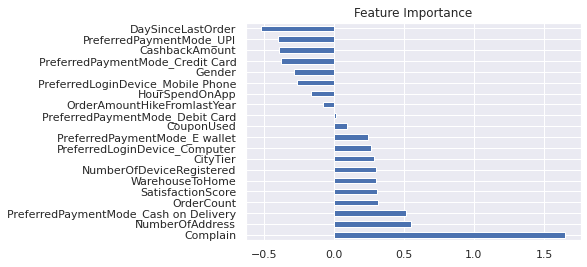

In [222]:
feature_list = X2_test.columns
importance = lr.coef_[0]
#importance is a list so you can plot it. 
features_importances = pd.Series(importance, index=feature_list)
features_importances.nlargest(20).plot(kind='barh',title = 'Feature Importance')

<h4>Oversampling</h4>

In [223]:
df.Churn.value_counts(normalize=True)

0.0    0.831616
1.0    0.168384
Name: Churn, dtype: float64

In [224]:
from imblearn.over_sampling import SMOTE

# melakukan oversampling pada data train menggunakan SMOTE
smote = SMOTE()
Xtrain_oversampled, ytrain_oversampled = smote.fit_resample(X2_train,y2_train)

# training model logistic regression pada data yang sudah di-oversampling
lr_oversampled = LogisticRegression()
lr_oversampled.fit(Xtrain_oversampled, ytrain_oversampled)

# menghasilkan prediksi pada data test yang sudah di-oversampling
y_pred_oversampled = lr_oversampled.predict(X2_test)

# mencetak nilai akurasi, presisi, recall, dan f1-score pada data test yang sudah di-oversampling
print("Accuracy ((Test Set - Oversampled): %.2f" % accuracy_score(y2_test, y_pred_oversampled))
print("Precision (Test Set - Oversampled): %.2f" % precision_score(y2_test, y_pred_oversampled))
print("Recall (Test Set - Oversampled): %.2f" % recall_score(y2_test, y_pred_oversampled))
print("F1-Score (Test Set - Oversampled): %.2f" % f1_score(y2_test, y_pred_oversampled))

Accuracy ((Test Set - Oversampled): 0.84
Precision (Test Set - Oversampled): 0.50
Recall (Test Set - Oversampled): 0.71
F1-Score (Test Set - Oversampled): 0.59


In [225]:
print(classification_report(y2_test['Churn'], y_pred_oversampled))

              precision    recall  f1-score   support

         0.0       0.94      0.86      0.90      1414
         1.0       0.50      0.71      0.59       275

    accuracy                           0.84      1689
   macro avg       0.72      0.79      0.74      1689
weighted avg       0.87      0.84      0.85      1689



ANALISA :
Setelah dilakukan oversampling, terjadi perubahan pada evaluasi performa model.

<li>Model terlihat lebih baik dalam memprediksi kelas minoritas dengan nilai recall dan F1-score untuk kelas 1 meningkat menjadi 0,67 dan 0,59 secara berturut-turut. </li>
<li>Namun, nilai presisi kelas 1 tetap rendah, yaitu 0,53. </li>
<li>Model juga menunjukkan penurunan dalam presisi, recall, dan F1-score untuk kelas mayoritas dengan nilai presisi dan recall kelas 0 yang menurun menjadi 0,93 dan 0,88, sementara F1-score kelas 0 adalah 0,91. </li>
<li>Akurasi model turun menjadi 0,85.</li>
<hr>
Secara keseluruhan, hasil Classification Report menunjukkan bahwa oversampling tidak memberikan dampak yang signifikan pada kinerja model dalam memprediksi kedua kelas

param values: 1e-05; train: 0.8403952233463856; test: 0.8120020573485919
param values: 1.9999999999999998e-05; train: 0.8408298944603985; test: 0.8123543782949724
param values: 2.9999999999999997e-05; train: 0.8412982116648269; test: 0.8128507136427927
param values: 3.9999999999999996e-05; train: 0.8416583157676492; test: 0.8132801851613732
param values: 4.9999999999999996e-05; train: 0.8420616141757343; test: 0.8137019416227338
param values: 5.9999999999999995e-05; train: 0.8424931025514649; test: 0.8140799794265141
param values: 7e-05; train: 0.8428759404991625; test: 0.8145583129741545
param values: 7.999999999999999e-05; train: 0.8432546863547826; test: 0.8148334833483347
param values: 8.999999999999999e-05; train: 0.84361388110381; test: 0.8152423813809953
param values: 9.999999999999999e-05; train: 0.8440044485587652; test: 0.8156178474990357
param values: 0.00010999999999999999; train: 0.8443886505371553; test: 0.8160498907033561
param values: 0.00011999999999999999; train: 0.84

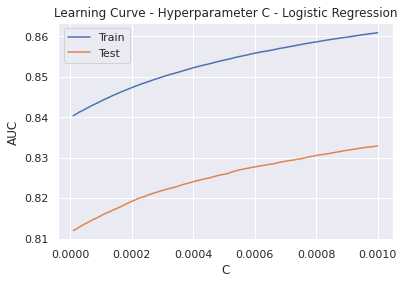

In [226]:
# Analyzing Learning Curve

import numpy as np
from matplotlib import pyplot as plt
from sklearn.linear_model import LogisticRegression

def draw_learning_curve(param_values) :
    train_scores = []
    test_scores = []
    
    for c in param_values:
        model = LogisticRegression(penalty='l2', C=c)
        model.fit(X2_train, y2_train)
        
        #eval on train
        rs_y_pred_train_proba = model.predict_proba(X2_train)
        train_auc = roc_auc_score(y2_train, rs_y_pred_train_proba[:, 1])
        train_scores.append(train_auc)
        
        #eval on test
        rs_y_pred_proba = model.predict_proba(X2_test)
        test_auc = roc_auc_score(y2_test, rs_y_pred_proba[:, 1])
        test_scores.append(test_auc)
        
        print('param values: ' + str(c) + '; train: ' + str(train_auc) + '; test: ' + str(test_auc))
        
    plt.plot(param_values, train_scores, label='Train')
    plt.plot(param_values, test_scores, label='Test')
    plt.xlabel('C')
    plt.ylabel('AUC')
    plt.title('Learning Curve - Hyperparameter C - Logistic Regression')
    plt.legend()
    plt.show()

param_values = [float(x) for x in np.linspace(0.00001, 0.001, 100)]
draw_learning_curve(param_values)

In [227]:
def eval_classification(rs):
    y_pred = rs.predict(Xtest)
    y_pred_train = rs.predict(Xtrain)
    y_pred_proba = rs.predict_proba(Xtest)
    y_pred_proba_train = rs.predict_proba(Xtrain)

    print("Accuracy (Test Set): %.2f" % accuracy_score(ytest, y_pred))
    print("Precision (Test Set): %.2f" % precision_score(ytest, y_pred))
    print("Recall (Test Set): %.2f" % recall_score(ytest, y_pred))
    print("F1-Score (Test Set): %.2f" % f1_score(ytest, y_pred))
    
    print("roc_auc (train-proba): %.2f" % roc_auc_score(ytrain, y_pred_proba_train[:, 1]))
    print("roc_auc (test-proba): %.2f" % roc_auc_score(ytest, y_pred_proba[:, 1]))
    
        
    cv_score = cross_validate(lr, X, y, cv=5, scoring='roc_auc', return_train_score=True)
    print('roc_auc (crossval train): '+ str(cv_score['train_score'].mean()))
    print('roc_auc (crossval test): '+ str(cv_score['test_score'].mean()))

In [228]:
# tuning hyperparameter
from sklearn.model_selection import RandomizedSearchCV
import numpy as np

penalty = ['l1', 'l2']
C = [float(x) for x in np.linspace(0.0001, 1, 100)]
hyperparameters = dict(penalty=penalty, C=C)

lr = LogisticRegression()
rs = RandomizedSearchCV(lr, hyperparameters, scoring='roc_auc', random_state=42, cv=5)
rs.fit(Xtrain, ytrain)
eval_classification(rs)

Accuracy (Test Set): 0.89
Precision (Test Set): 0.76
Recall (Test Set): 0.51
F1-Score (Test Set): 0.61
roc_auc (train-proba): 0.89
roc_auc (test-proba): 0.86
roc_auc (crossval train): 0.8786153791425788
roc_auc (crossval test): 0.8776098976541317


<h3>Decision Tree</h3>

In [229]:
X3_train = Xtrain.copy()
X3_test = Xtest.copy()
y3_train = ytrain.copy()
y3_test = ytest.copy()
print('X train :',X3_train.shape)
print('X test :',X3_test.shape)
print('y train :',y3_train.shape)
print('y test :',y3_test.shape)

X train : (3941, 21)
X test : (1689, 21)
y train : (3941,)
y test : (1689, 1)


In [230]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier

def eval_classification(model):
    dt_y_pred = model.predict(X3_test)
    dt_y_pred_train = model.predict(X3_train)
    dt_y_pred_proba = model.predict_proba(X3_test)
    dt_y_pred_proba_train = model.predict_proba(X3_train)
    
    print("Accuracy (Test Set): %.2f" % accuracy_score(y3_test, dt_y_pred))
    print("Precision (Test Set): %.2f" % precision_score(y3_test, dt_y_pred))
    print("Recall (Test Set): %.2f" % recall_score(y3_test, dt_y_pred))
    print("F1-Score (Test Set): %.2f" % f1_score(y3_test, dt_y_pred))
    
    print("roc_auc (test-proba): %.2f" % roc_auc_score(y3_test, dt_y_pred_proba[:, 1]))
    print("roc_auc (train-proba): %.2f" % roc_auc_score(y3_train, dt_y_pred_proba_train[:, 1]))

In [231]:
from sklearn.tree import DecisionTreeClassifier # import decision tree dari sklearn
dt = DecisionTreeClassifier() # inisiasi object dengan nama dt
dt.fit(X3_train, y3_train) # fit model decision tree dari data train
eval_classification(dt)

Accuracy (Test Set): 0.93
Precision (Test Set): 0.79
Recall (Test Set): 0.81
F1-Score (Test Set): 0.80
roc_auc (test-proba): 0.89
roc_auc (train-proba): 1.00


In [232]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from scipy.stats import uniform
import numpy as np

# List of hyperparameter
max_depth = [int(x) for x in np.linspace(1, 110, num = 30)] # Maximum number of levels in tree
min_samples_split = [2, 5, 10, 100] # Minimum number of samples required to split a node
min_samples_leaf = [1, 2, 4, 10, 20, 50] # Minimum number of samples required at each leaf node
max_features = ['auto', 'sqrt'] # Number of features to consider at every split
criterion = ['gini','entropy']
splitter = ['best','random']

hyperparameters = dict(max_depth=max_depth, 
                       min_samples_split=min_samples_split, 
                       min_samples_leaf=min_samples_leaf,
                       max_features=max_features,
                       criterion=criterion,
                       splitter=splitter
                      )

# Inisialisasi Model
dt = DecisionTreeClassifier(random_state=42)
model = GridSearchCV(dt, hyperparameters, cv=5, scoring='precision')
model.fit(X3_train, y3_train)

# Predict & Evaluation
dt_y_pred = model.predict(X3_test)#Check performa dari model
eval_classification(model)

Accuracy (Test Set): 0.94
Precision (Test Set): 0.81
Recall (Test Set): 0.83
F1-Score (Test Set): 0.82
roc_auc (test-proba): 0.90
roc_auc (train-proba): 1.00


In [233]:
model = RandomForestClassifier(max_depth = 3, n_estimators=10)
model.fit(X3_train, y3_train)
estimator_limited = model.estimators_[5]
estimator_limited

DecisionTreeClassifier(max_depth=3, max_features='sqrt', random_state=222285008)

In [234]:
from sklearn.tree import export_graphviz

export_graphviz(estimator_limited, out_file='tree_limited.dot', feature_names = X3_train.columns,
                class_names = ['churn', 'not churn'],
                rounded = True, proportion = False, precision = 2, filled = True)

In [235]:
!dot -Tpng tree_limited.dot -o tree_limited.png

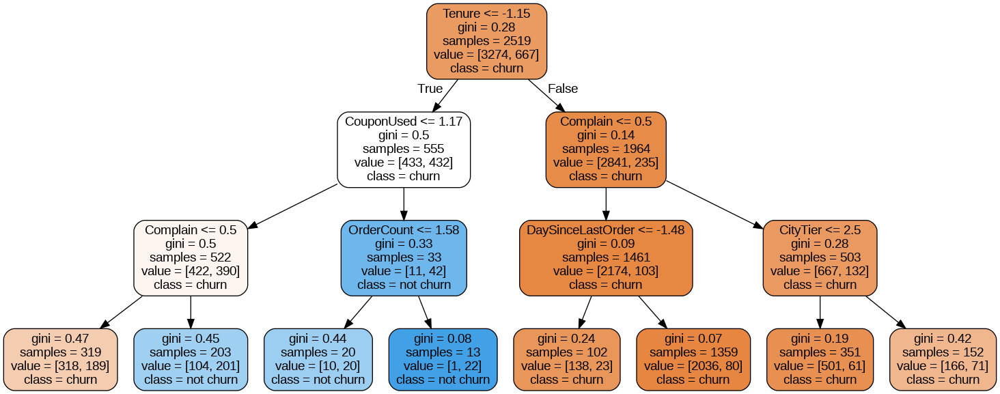

In [236]:
from IPython.display import Image
Image(filename = 'tree_limited.png')

In [237]:
model = RandomForestClassifier(max_depth = None, n_estimators=10)
model.fit(X3_train, y3_train)
estimator_nonlimited = model.estimators_[5]

export_graphviz(estimator_nonlimited, out_file='tree_nonlimited.dot', feature_names = X3_train.columns,
                rounded = True, proportion = False, precision = 2)

!dot -Tpng tree_nonlimited.dot -o tree_nonlimited.png -Gdpi=30

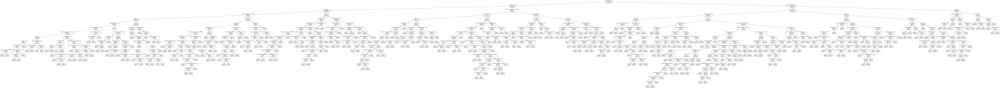

In [238]:
from IPython.display import Image
Image(filename = 'tree_nonlimited.png')